# 18: Indirect Space Charge

## Plot charge density grid

In [285]:
# import imageio
# import pickle
# import pandas as pd
import numpy as np
# import PyNAFF as pnf
import scipy.io as sio 
import matplotlib.cm as cm
from math import log10, floor
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.patches import Patch
from scipy.optimize import curve_fit
from mpl_toolkits.mplot3d import axes3d

In [268]:
plt.rcParams['figure.figsize'] = [4.0, 4.0]
plt.rcParams['figure.dpi'] = 200
plt.rcParams['savefig.dpi'] = 200

plt.rcParams['font.size'] = 10
plt.rcParams['legend.fontsize'] = 'small'
plt.rcParams['lines.linewidth'] = 1.5

### Function Declarations

In [4]:
def harmonic_fn(x, a, b, c, d):
    return a + b*np.cos(c + 2*np.pi*d*x)

def quadratic(x, a, m, c):
    return a*x**2 + x*m + c

def quadratic(x, a, m, c):
    return a*x**2 + x*m + c

def Md_fit(x, a, b, c, d):
        return a + b*np.cos(c*x+d)
    
def Md_ramp_fit(x, a, b, c, d):
    return a + b*(x-1)*np.cos(c*(x-1)+d)

def round_sig(x, sig=4):
    return round(x, sig-int(floor(log10(abs(x))))-1)

In [5]:
def add_input_file(dd, filename, label):
	f = filename
	p = dict()
	sio.loadmat(f, mdict=p)
	dd[label] = p	
	print '\tAdded output data from ', filename, '\t dictionary key: ', label
	return dd

In [6]:
def add_rho_file(dd, filename, label):
	f = filename
	p = dict()
	sio.loadmat(f, mdict=p)
	dd[label] = p	
	print '\tAdded output data from ', filename, '\t dictionary key: ', label
	return dd

In [7]:
def round_sig(x, sig=3):
    return round(x, sig-int(floor(log10(abs(x))))-1)

## Labels etc

In [8]:
save_folder = 'Plots/'
sc = 'SbS'
legend_label = 'Case'
main_label = 'Rho Grid Test'
betagamma = 2.492104532 * 0.9159915293879255

## Import Data - our grid is 312 * 206 * 64 with indirect SC

In [9]:
dd_rho = dict()
dd_rho = add_rho_file(dd_rho, '1_1_1/space_charge_output/Rho_grid_0.mat', 'Rho')

dd_phi = dict()
dd_phi = add_rho_file(dd_phi, '1_1_1/space_charge_output/Phi_grid_0.mat', 'Phi')

	Added output data from  1_1_1/space_charge_output/Rho_grid_0.mat 	 dictionary key:  Rho
	Added output data from  1_1_1/space_charge_output/Phi_grid_0.mat 	 dictionary key:  Phi


In [10]:
dd_rho['Rho'].keys()

['y_grid',
 'z_grid',
 '__header__',
 'Ey_grid',
 '__globals__',
 'Ex_grid',
 'Ez_grid',
 'rho_grid',
 '__version__',
 'x_grid']

In [456]:
def round_sig(x, sig=3):
    return round(x, sig-int(floor(log10(abs(x))))-1)

# Test class to handle Phi Grid
class PhiGrid:
    def __init__(self, filename, label, verbose =True):
        self.filename = filename
        self.label = label
        self.verbose = verbose
        self.initialise_data()        

    def initialise_data(self):
        # Load data
        p = dict()
        self.dd = dict()
        sio.loadmat(self.filename, mdict=p)
        self.dd[self.label] = p
        
        if self.verbose: print 'PhiGrid::initialise_data: Added output data from ', self.filename, '\t dictionary label: ', self.label        
        
        # Find 3D grid sizes
        self.x_grid_size = len(self.dd[self.label]['phi_grid'])
        if self.verbose: print 'PhiGrid::initialise_data: X grid length = ', (self.x_grid_size)
        self.y_grid_size = len(self.dd[self.label]['phi_grid'][self.x_grid_size-1])
        if self.verbose: print 'PhiGrid::initialise_data: Y grid length = ', (self.y_grid_size)
        self.z_grid_size = len(self.dd[self.label]['phi_grid'][self.x_grid_size-1][self.y_grid_size-1])
        if self.verbose: print 'PhiGrid::initialise_data: Z grid length = ', (self.z_grid_size)
        
        # Create x, y, z index arrays
        self.x_ = np.linspace(1,self.x_grid_size,self.x_grid_size, dtype='int')
        self.y_ = np.linspace(1,self.y_grid_size,self.y_grid_size, dtype='int')
        self.z_ = np.linspace(1,self.z_grid_size,self.z_grid_size, dtype='int')
        
        # Populate co-ordinate arrays
        x_co = []
        y_co = []
        z_co = []
        for ix in xrange(self.x_grid_size):
            x_co.append(self.dd[self.label]['x_grid'][ix][0][0])
        for iy in xrange(self.y_grid_size):
            y_co.append(self.dd[self.label]['y_grid'][0][iy][0])
        for iz in xrange(self.z_grid_size):
            z_co.append(self.dd[self.label]['z_grid'][0][0][iz])
        
        self.x = np.array(x_co)
        self.y = np.array(y_co)
        self.z = np.array(z_co)        
        
    def get_x_indices(self):
        return self.x_
                
    def get_y_indices(self):
        return self.y_
                
    def get_z_indices(self):
        return self.z_
    
    def get_indices(self):
        return self.x_,self.y_,self.z_
    
    def get_x_coordinates(self):
        return self.x
                
    def get_y_coordinates(self):
        return self.y
                
    def get_z_coordinates(self):
        return self.z
    
    def get_coordinates(self):
        return self.x,self.y,self.z
    
    def get_x_grid_length(self):
        return self.x_grid_size
                
    def get_y_grid_length(self):
        return self.y_grid_size
                
    def get_z_grid_length(self):
        return self.z_grid_size
    
    def get_grid_lengths(self):
        return self.x_grid_size,self.y_grid_size,self.z_grid_size
    
    # return a single xy grid for a given z (in arbitrary unit not metres)
    def get_phi_xy_grid(self,z):
        m = np.ones(shape=[self.y_grid_size, self.x_grid_size])        
        for iy in self.y_:
            for ix in self.x_:
                m[iy-1,ix-1] = self.dd[self.label]['phi_grid'][ix-1][iy-1][z]        
        return m   
    
    # return a single xz grid for a given y (in arbitrary unit not metres)
    def get_phi_xz_grid(self,y):
        m = np.ones(shape=[self.z_grid_size, self.x_grid_size])        
        for iz in self.z_:
            for ix in self.x_:
                m[iz-1,ix-1] = self.dd[self.label]['phi_grid'][ix-1][y][iz-1]        
        return m  
    
    # return a single xy grid for a given z (in arbitrary unit not metres)
    def get_Ex_xy_grid(self,z):
        m = np.ones(shape=[self.y_grid_size, self.x_grid_size])        
        for iy in self.y_:
            for ix in self.x_:
                m[iy-1,ix-1] = self.dd[self.label]['Ex_grid'][ix-1][iy-1][z]        
        return m     
    
    # return a single xy grid for a given z (in arbitrary unit not metres)
    def get_phi_x_slice(self,y,z):
        m = np.ones(shape=[self.x_grid_size])        
        for ix in self.x_:
            m[ix-1] = self.dd[self.label]['phi_grid'][ix-1][y][z]        
        return m  
    
    def get_xy_wireframes(self):        
        # Our x array is co-ordinates only, repeated for y rows
        x_wireframe = np.zeros(shape=[self.get_y_grid_length(), self.get_x_grid_length()])
        for iy in xrange(self.get_y_grid_length()):
            x_wireframe[iy] = self.get_x_coordinates()

        # Our y array is co-ordinates only, repeated for x rows
        y_wireframe = np.zeros(shape=[self.get_x_grid_length(), self.get_y_grid_length()])
        for ix in xrange(self.get_x_grid_length()):
            y_wireframe[ix] = self.get_y_coordinates()
            
        # Don't forget to transpose the Y so that both have the same shape for plotting
        return x_wireframe, y_wireframe.T
    
    def get_xz_wireframes(self):        
        # Our x array is co-ordinates only, repeated for y rows
        x_wireframe = np.zeros(shape=[self.get_z_grid_length(), self.get_x_grid_length()])
        for iz in xrange(self.get_z_grid_length()):
            x_wireframe[iz] = self.get_x_coordinates()

        # Our y array is co-ordinates only, repeated for x rows
        z_wireframe = np.zeros(shape=[self.get_x_grid_length(), self.get_z_grid_length()])
        for ix in xrange(self.get_x_grid_length()):
            z_wireframe[ix] = self.get_z_coordinates()
            
        # Don't forget to transpose the Y so that both have the same shape for plotting
        return x_wireframe, z_wireframe.T
    
    def plot_xy_phi_wireframe(self, z, title='Phi_Grid', label='Test', save=False, savename='Phi_Grid.png'):
    #def plot_xy_phi_wireframe(self, z, title, label, save, savename):
        
        plt.rcParams['figure.figsize'] = [5.0, 5.0]
        plt.rcParams['figure.dpi'] = 200
        plt.rcParams['savefig.dpi'] = 200

        plt.rcParams['font.size'] = 10
        plt.rcParams['legend.fontsize'] = 'small'
        plt.rcParams['lines.linewidth'] = 0.5

        fig1 = plt.figure(facecolor='w', edgecolor='k')
        ax1 = fig1.add_subplot(111, projection='3d')

        tit = str(title + ' ' + label + ' z = ' + str(round_sig(self.get_z_coordinates()[z])) + ' m')
        ax1.set_title(tit);

        ax1.set_xlabel('x [m]');
        ax1.set_ylabel('y [m]');
        ax1.set_zlabel(r'$\phi_{SC}$ [-]');

        z_len = int(test.get_z_grid_length())

        colors = matplotlib.cm.rainbow(np.linspace(0, 1, z_len))
        c_it = int(0)

        # Choice of z is important - here we take the central grid point
        phi_wireframe = test.get_phi_xy_grid(z)
        surf = ax1.plot_wireframe(test.get_xy_wireframes()[0], test.get_xy_wireframes()[1], phi_wireframe, rstride=1, cstride=1, linewidth=0.5, antialiased=True, alpha=.7)

        ax1.grid(lw=1, ls=':');
        plt.tight_layout()
        if save: plt.savefig(savename);
        plt.show()
        return 1
    
    def plot_x_phi_slice(self, y, z, title='Phi_x_slice', label='Test', save=False, savename='Phi_x_Slice.png'):
        
        plt.rcParams['figure.figsize'] = [5.0, 5.0]
        plt.rcParams['figure.dpi'] = 200
        plt.rcParams['savefig.dpi'] = 200

        plt.rcParams['font.size'] = 10
        plt.rcParams['legend.fontsize'] = 'small'
        plt.rcParams['lines.linewidth'] = 0.5

        fig1 = plt.figure(facecolor='w', edgecolor='k')
        ax1 = fig1.add_subplot(111)

        tit = str(title + ' ' + label + ' y = ' + str(round_sig(self.get_y_coordinates()[y])) + ' m, z = ' + str(round_sig(self.get_z_coordinates()[z])) + ' m')
        ax1.set_title(tit);

        ax1.set_xlabel('x [m]');
        ax1.set_ylabel(r'$\phi_{SC}$ [-]');

        z_len = int(test.get_z_grid_length())

        colors = matplotlib.cm.rainbow(np.linspace(0, 1, z_len))
        c_it = int(0)

        # Choice of z is important - here we take the central grid point
        ax1.plot(self.x, self.get_phi_x_slice(y,z))

        ax1.grid(lw=1, ls=':');
        plt.tight_layout()
        if save: plt.savefig(savename);
        plt.show()
        return 1 
    
    def plot_xy_phi_surface(self, z, title='Phi_Grid', label='Test', save=False, savename='Phi_Grid.png'):
        
        plt.rcParams['figure.figsize'] = [5.0, 5.0]
        plt.rcParams['figure.dpi'] = 200
        plt.rcParams['savefig.dpi'] = 200

        plt.rcParams['font.size'] = 10
        plt.rcParams['legend.fontsize'] = 'small'
        plt.rcParams['lines.linewidth'] = 1.0

        fig1 = plt.figure(facecolor='w', edgecolor='k')
        ax1 = fig1.add_subplot(111, projection='3d')

        tit = str(title + ' ' + label + ' z = ' + str(round_sig(self.get_z_coordinates()[z])) + ' m')
        ax1.set_title(tit);

        ax1.set_xlabel('x [m]');
        ax1.set_ylabel('y [m]');
        ax1.set_zlabel(r'$\phi_{SC}$ [-]');

        z_len = int(test.get_z_grid_length())

        colors = matplotlib.cm.rainbow(np.linspace(0, 1, z_len))
        c_it = int(0)

        # Choice of z is important - here we take the central grid point
        phi_wireframe = test.get_phi_xy_grid(z)
        surf = ax1.plot_surface(test.get_xy_wireframes()[0], test.get_xy_wireframes()[1], phi_wireframe, cmap=cm.jet, rstride=1, cstride=1, linewidth=1., antialiased=True, alpha=.7)

        ax1.grid(lw=1, ls=':');
        plt.tight_layout()
        if save: plt.savefig(savename, dpi = 800);
        plt.show()
        return 1 
    
    def plot_xz_phi_surface(self, y, title='Phi_Grid', label='Test', save=False, savename='Phi_Grid.png'):
        
        plt.rcParams['figure.figsize'] = [5.0, 5.0]
        plt.rcParams['figure.dpi'] = 200
        plt.rcParams['savefig.dpi'] = 200

        plt.rcParams['font.size'] = 10
        plt.rcParams['legend.fontsize'] = 'small'
        plt.rcParams['lines.linewidth'] = 0.5

        fig1 = plt.figure(facecolor='w', edgecolor='k')
        ax1 = fig1.add_subplot(111, projection='3d')

        tit = str(title + ' ' + label + ' y = ' + str(round_sig(self.get_y_coordinates()[y])) + ' m')
        ax1.set_title(tit);

        ax1.set_xlabel('x [m]');
        ax1.set_ylabel('z [m]');
        ax1.set_zlabel(r'$\phi_{SC}$ [-]');

        z_len = int(test.get_z_grid_length())

        colors = matplotlib.cm.rainbow(np.linspace(0, 1, z_len))
        c_it = int(0)

        # Choice of z is important - here we take the central grid point
        phi_wireframe = test.get_phi_xz_grid(y)
        surf = ax1.plot_surface(test.get_xz_wireframes()[0], test.get_xz_wireframes()[1], phi_wireframe, cmap=cm.jet, rstride=1, cstride=1, linewidth=1., antialiased=True, alpha=.7)

        ax1.grid(lw=1, ls=':');
        plt.tight_layout()
        if save: plt.savefig(savename);
        plt.show()
        return 1
    
    def plot_xy_Ex_surface(self, z, title='Phi_Grid', label='Test', save=False, savename='Phi_Grid.png'):
        
        plt.rcParams['figure.figsize'] = [5.0, 5.0]
        plt.rcParams['figure.dpi'] = 200
        plt.rcParams['savefig.dpi'] = 200

        plt.rcParams['font.size'] = 10
        plt.rcParams['legend.fontsize'] = 'small'
        plt.rcParams['lines.linewidth'] = 0.5

        fig1 = plt.figure(facecolor='w', edgecolor='k')
        ax1 = fig1.add_subplot(111, projection='3d')

        tit = str(title + ' ' + label + ' z = ' + str(round_sig(self.get_z_coordinates()[z])) + ' m')
        ax1.set_title(tit);

        ax1.set_xlabel('x [m]');
        ax1.set_ylabel('y [m]');
        ax1.set_zlabel(r'$E_{x}$ [-]');

        z_len = int(test.get_z_grid_length())

        colors = matplotlib.cm.rainbow(np.linspace(0, 1, z_len))
        c_it = int(0)

        # Choice of z is important - here we take the central grid point
        phi_wireframe = test.get_Ex_xy_grid(z)
        surf = ax1.plot_surface(test.get_xy_wireframes()[0], test.get_xy_wireframes()[1], phi_wireframe, cmap=cm.jet, rstride=1, cstride=1, linewidth=1., antialiased=True, alpha=.7)

        ax1.grid(lw=1, ls=':');
        plt.tight_layout()
        if save: plt.savefig(savename);
        plt.show()
        return 1 
    

In [458]:
test = PhiGrid('1_1_1/space_charge_output_original/Phi_grid_0.mat', 'nModes=10')

PhiGrid::initialise_data: Added output data from  1_1_1/space_charge_output_original/Phi_grid_0.mat 	 dictionary label:  nModes=10
PhiGrid::initialise_data: X grid length =  312
PhiGrid::initialise_data: Y grid length =  206
PhiGrid::initialise_data: Z grid length =  64


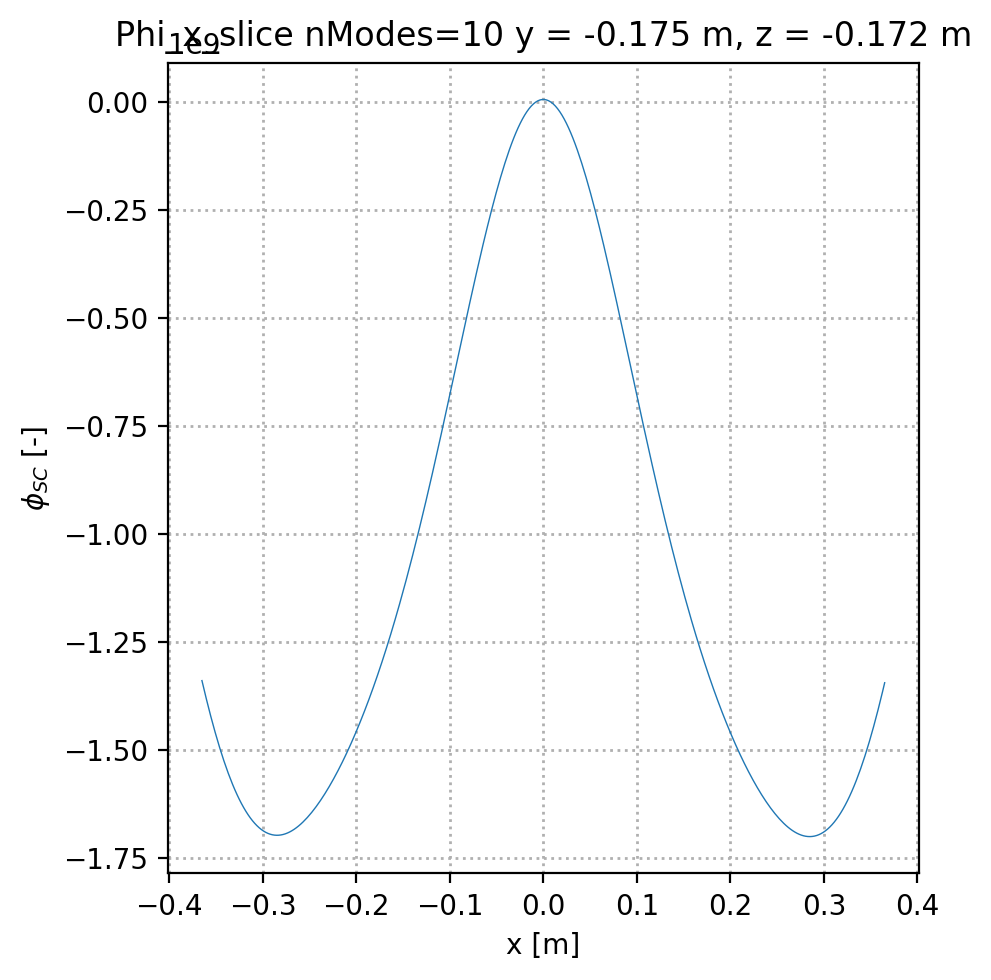

1

In [459]:
test.plot_x_phi_slice(0, 31, title='Phi_x_slice', label='nModes=10', save=False, savename='Phi_Slice_x_nmodes10.png')

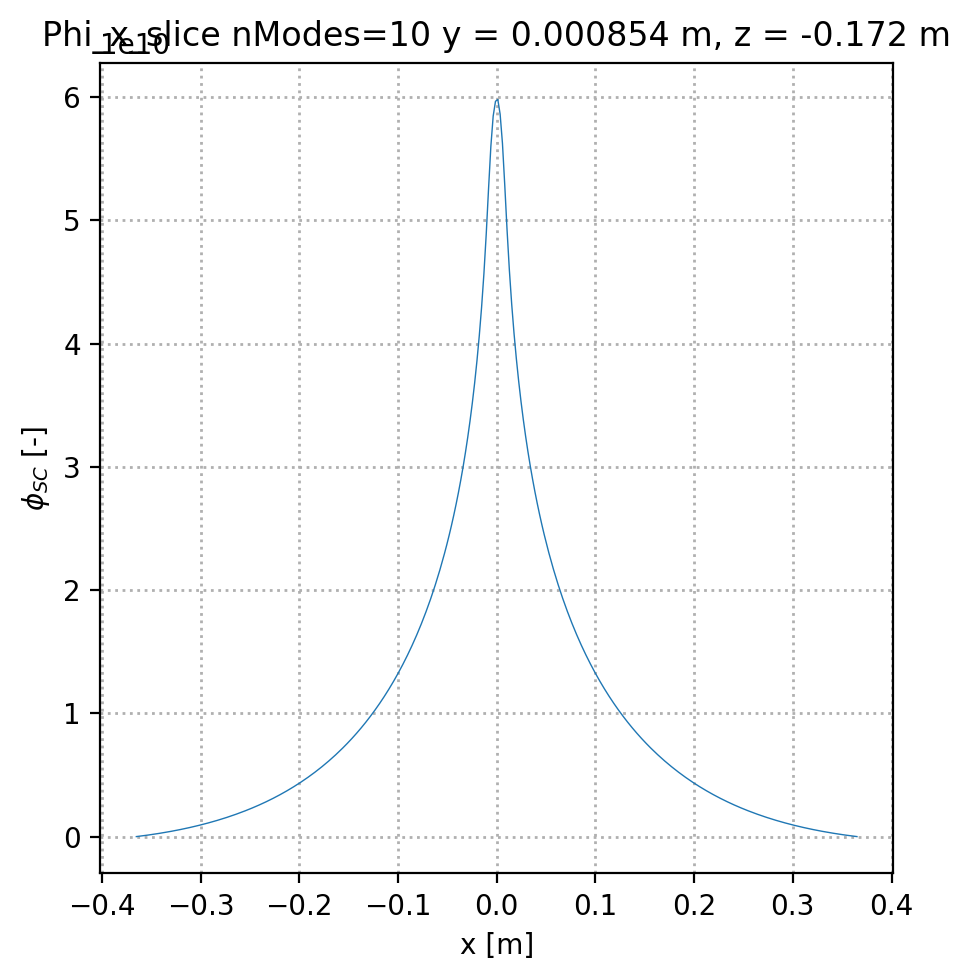

1

In [461]:
test.plot_x_phi_slice(103, 31, title='Phi_x_slice', label='nModes=10', save=False, savename='Phi_Slice_x_nmodes10.png')

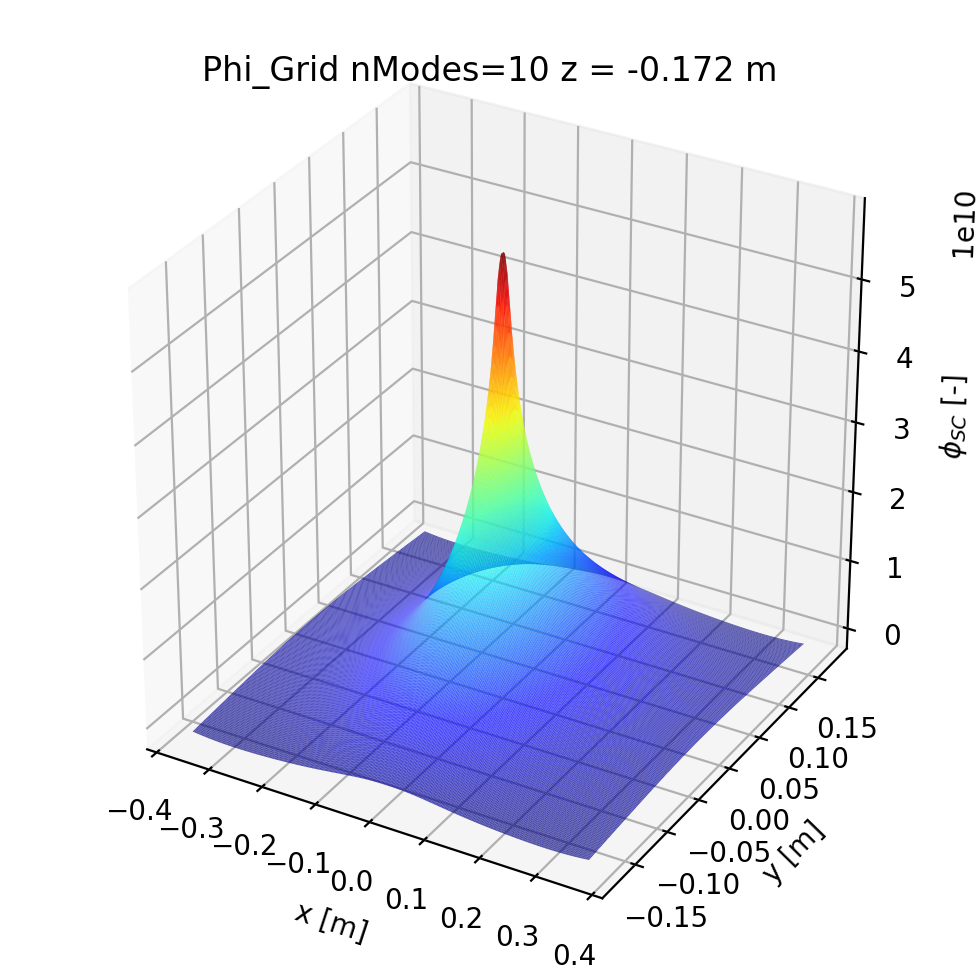

1

In [460]:
test.plot_xy_phi_surface(31, title='Phi_Grid', label='nModes=10', save=False, savename='Phi_Grid_xy_nmodes10.png')

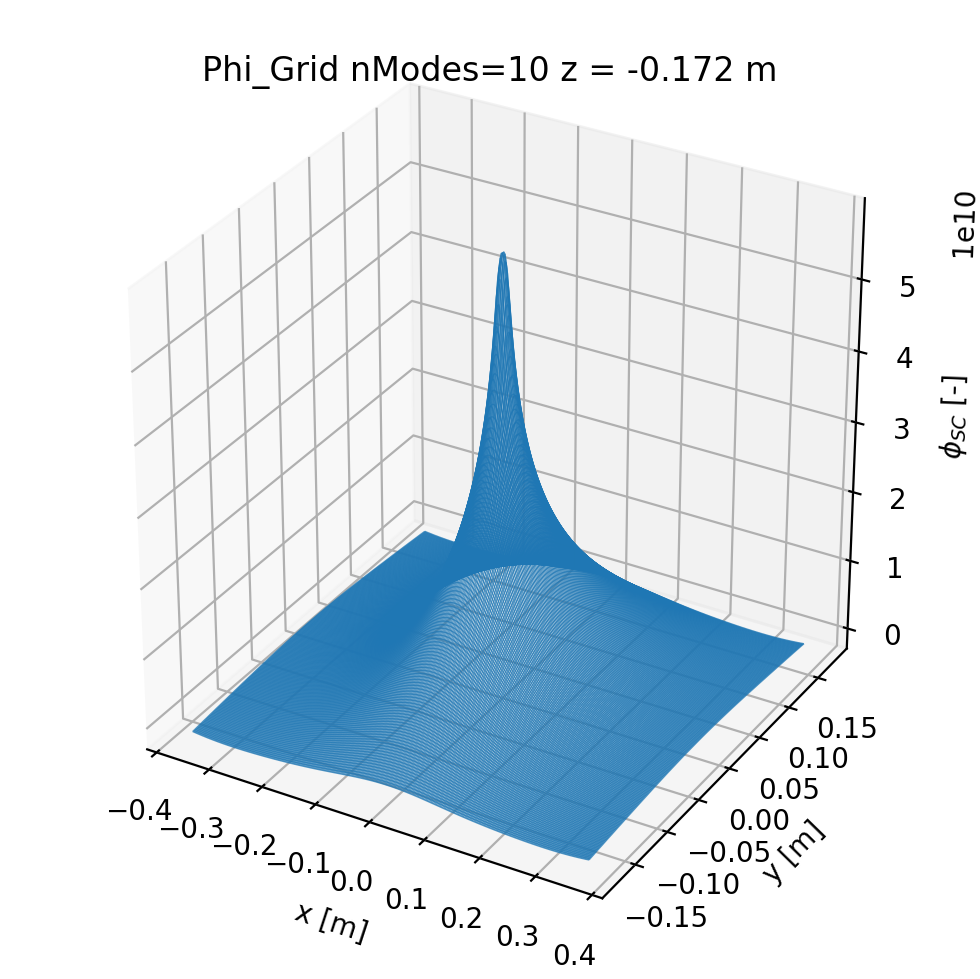

1

In [428]:
test.plot_xy_phi_wireframe(31, title='Phi_Grid', label='nModes=10', save=False, savename='Phi_Grid_xy_nmodes10.png')

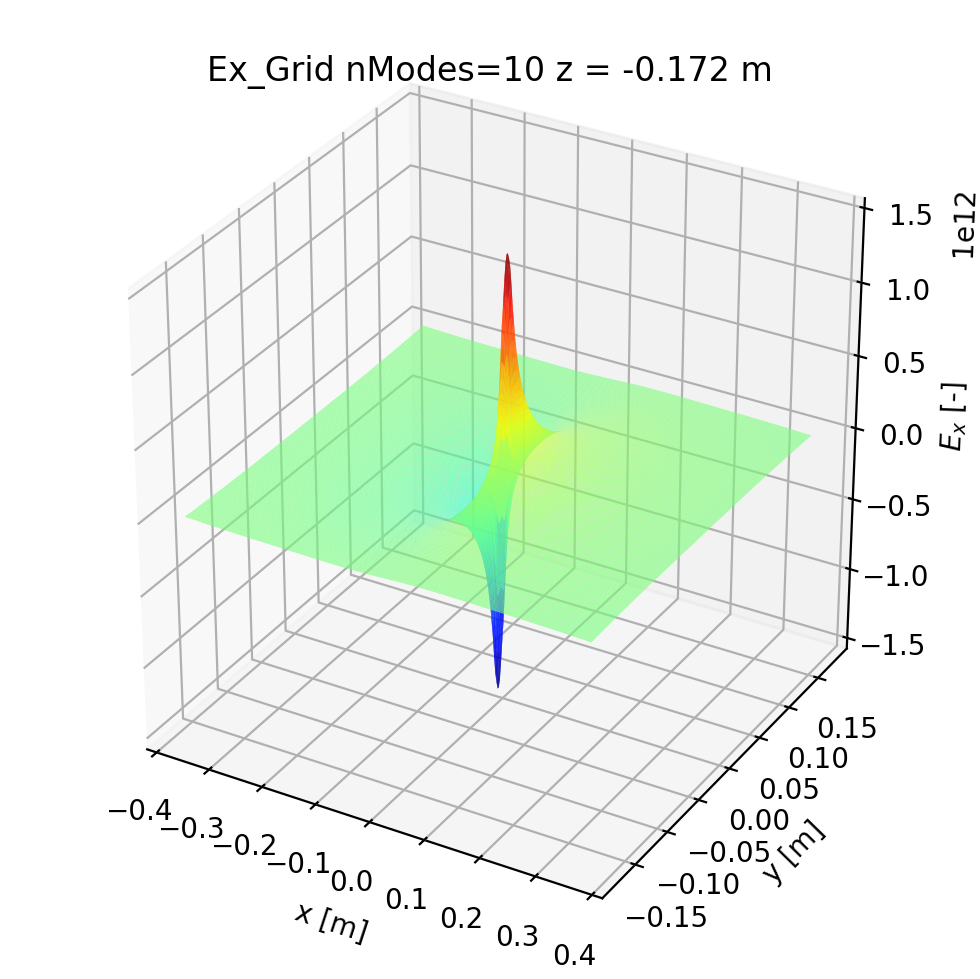

1

In [429]:
test.plot_xy_Ex_surface(31, title='Ex_Grid', label='nModes=10', save=False, savename='Ex_Grid_xy_nmodes10.png')

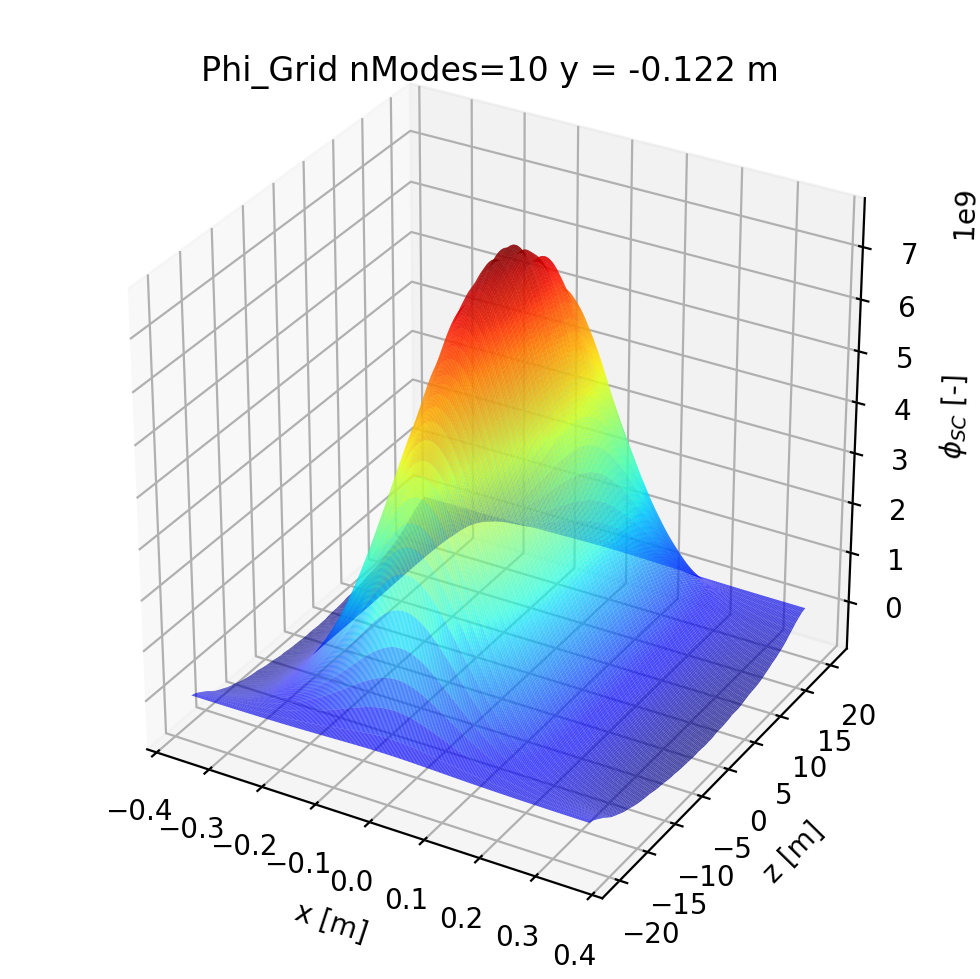

1

In [436]:
test.plot_xz_phi_surface(31, title='Phi_Grid', label='nModes=10', save=False, savename='Phi_Grid__xz_nmodes10.png')

# nModes = 1

In [437]:
test2 = PhiGrid('1_1_1/space_charge_output_nMode1/Phi_grid_0.mat', 'nModes=1')

PhiGrid::initialise_data: Added output data from  1_1_1/space_charge_output_nMode1/Phi_grid_0.mat 	 dictionary label:  nModes=1
PhiGrid::initialise_data: X grid length =  312
PhiGrid::initialise_data: Y grid length =  206
PhiGrid::initialise_data: Z grid length =  64


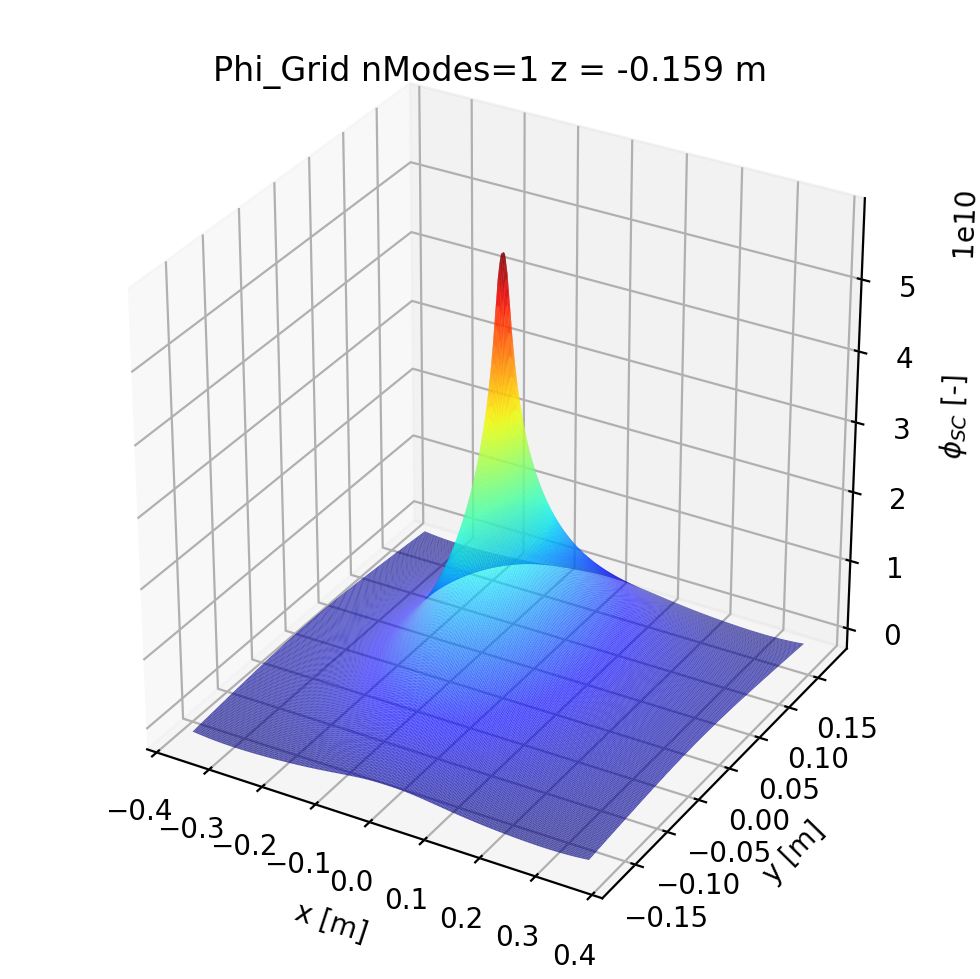

1

In [438]:
test2.plot_xy_phi_surface(31, title='Phi_Grid', label='nModes=1', save=False, savename='Phi_Grid_nmodes1.png')

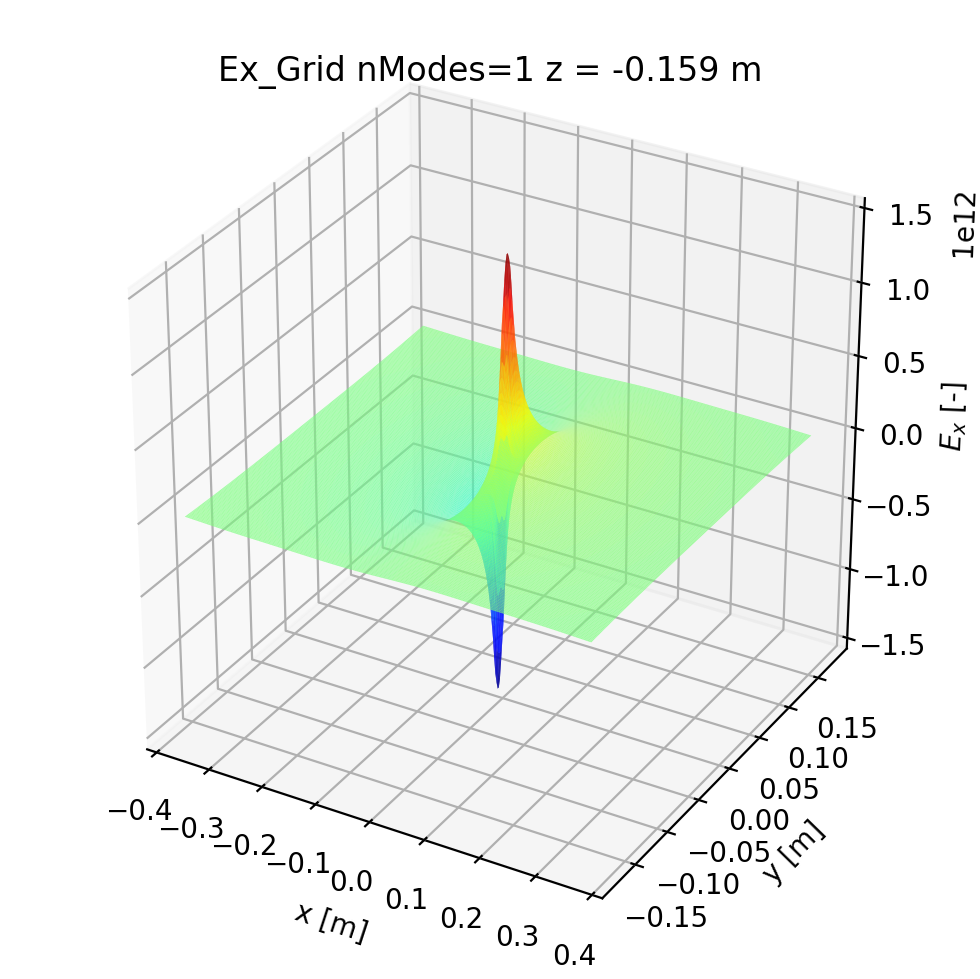

1

In [439]:
test2.plot_xy_Ex_surface(31, title='Ex_Grid', label='nModes=1', save=False, savename='Ex_Grid_nmodes1.png')

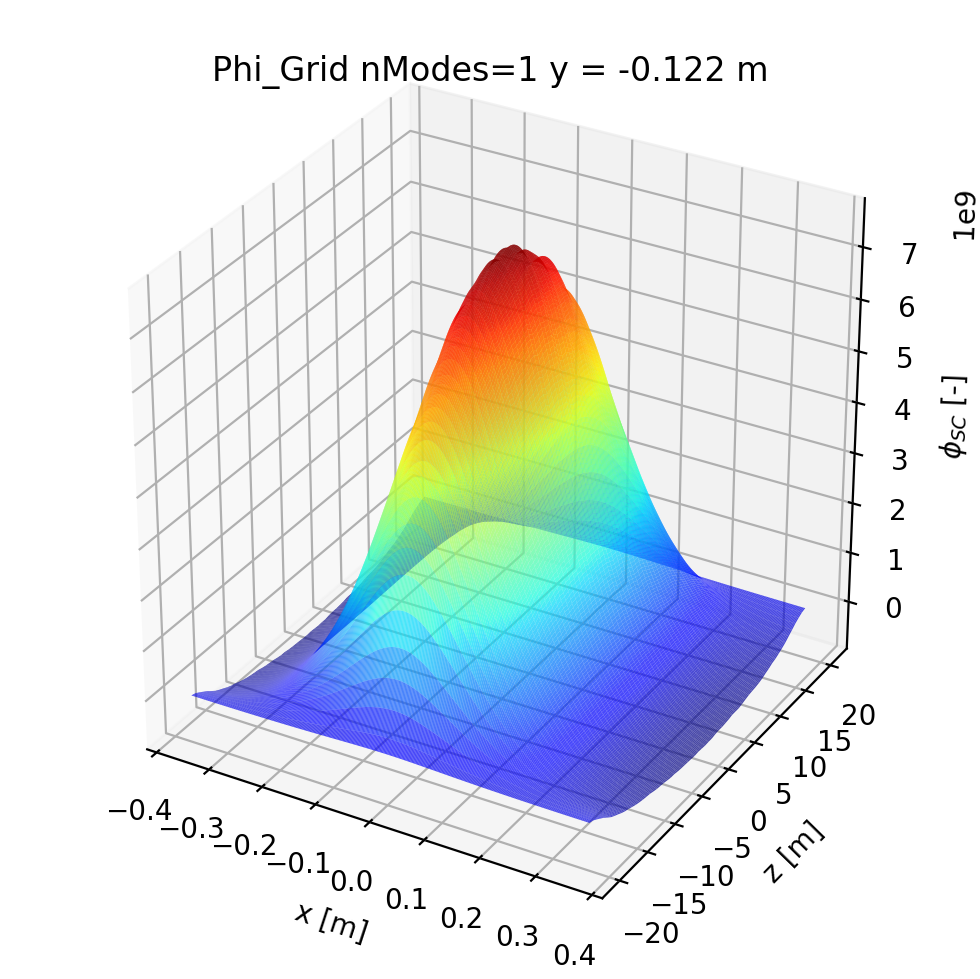

1

In [441]:
test2.plot_xz_phi_surface(31, title='Phi_Grid', label='nModes=1', save=False, savename='Phi_Grid__xz_nmodes1.png')

# nModes = 50

In [452]:
test3 = PhiGrid('1_1_1/space_charge_output_nMode50/Phi_grid_0.mat', 'nModes=50')

PhiGrid::initialise_data: Added output data from  1_1_1/space_charge_output_nMode50/Phi_grid_0.mat 	 dictionary label:  nModes=50
PhiGrid::initialise_data: X grid length =  312
PhiGrid::initialise_data: Y grid length =  206
PhiGrid::initialise_data: Z grid length =  64


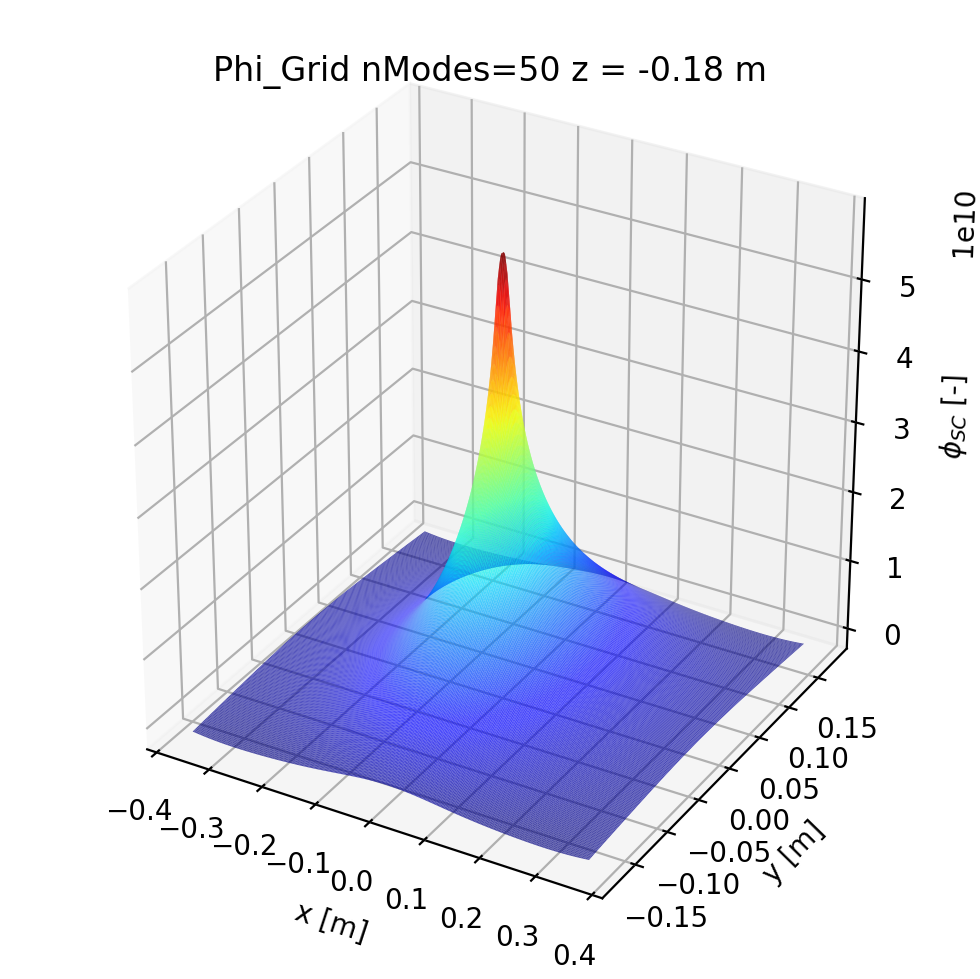

1

In [453]:
test3.plot_xy_phi_surface(31, title='Phi_Grid', label='nModes=50', save=False, savename='Phi_Grid_nmodes50.png')

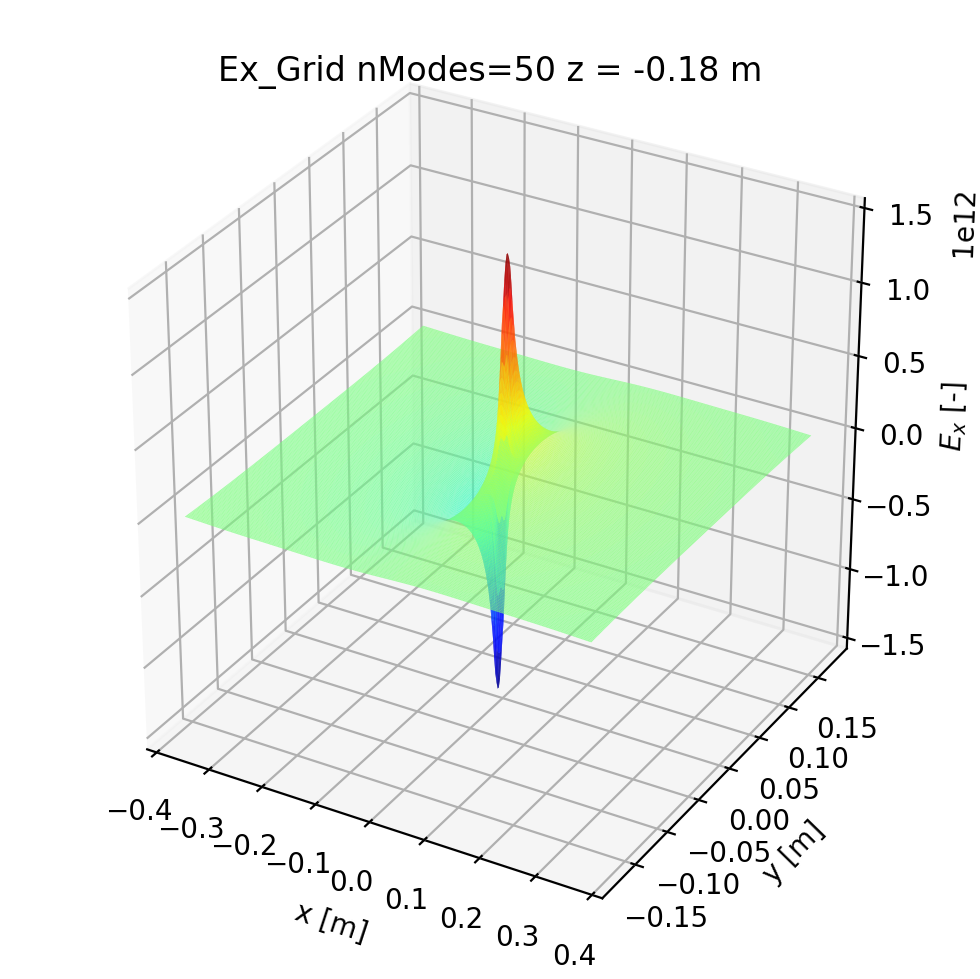

1

In [454]:
test3.plot_xy_Ex_surface(31, title='Ex_Grid', label='nModes=50', save=False, savename='Ex_Grid_nmodes50.png')

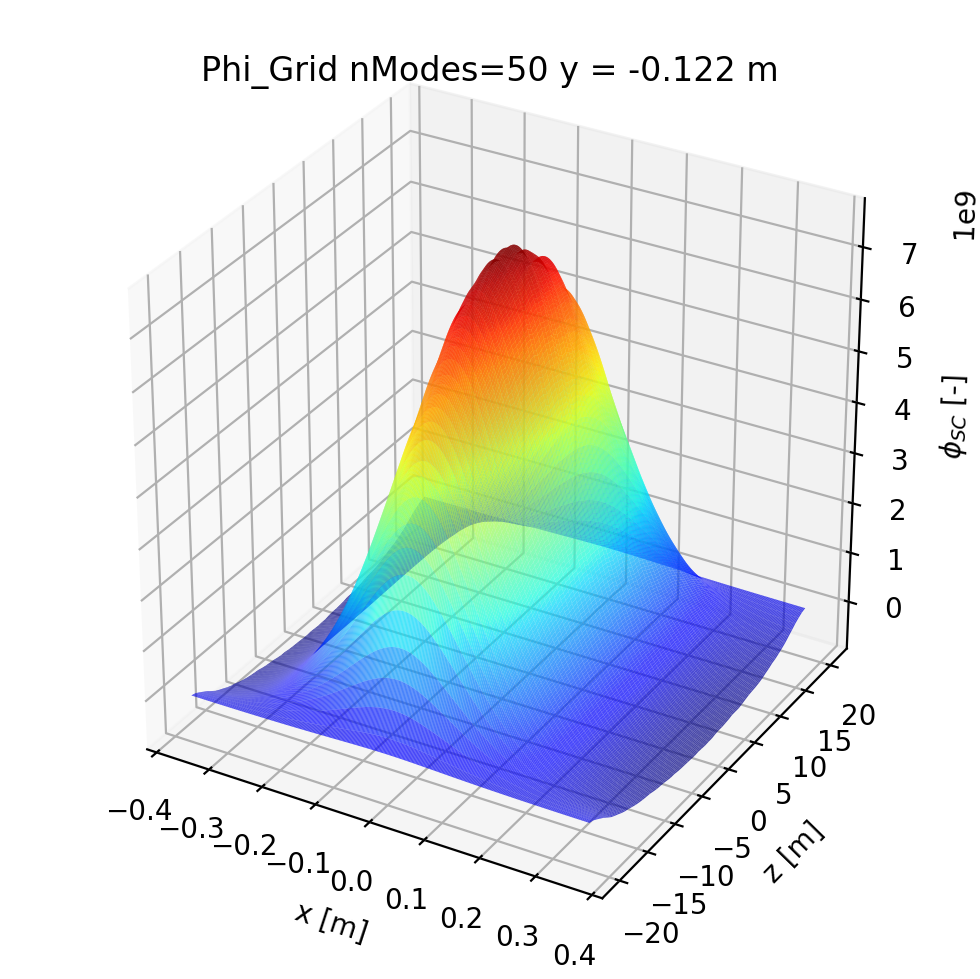

1

In [455]:
test3.plot_xz_phi_surface(31, title='Phi_Grid', label='nModes=50', save=False, savename='Phi_Grid__xz_nmodes50.png')

# nModes = 50 499 points (instead of 128)

In [463]:
test4 = PhiGrid('1_1_1/space_charge_output_nMode50_499/Phi_grid_0.mat', 'nModes=50')


PhiGrid::initialise_data: Added output data from  1_1_1/space_charge_output_nMode50_499/Phi_grid_0.mat 	 dictionary label:  nModes=50
PhiGrid::initialise_data: X grid length =  312
PhiGrid::initialise_data: Y grid length =  206
PhiGrid::initialise_data: Z grid length =  64


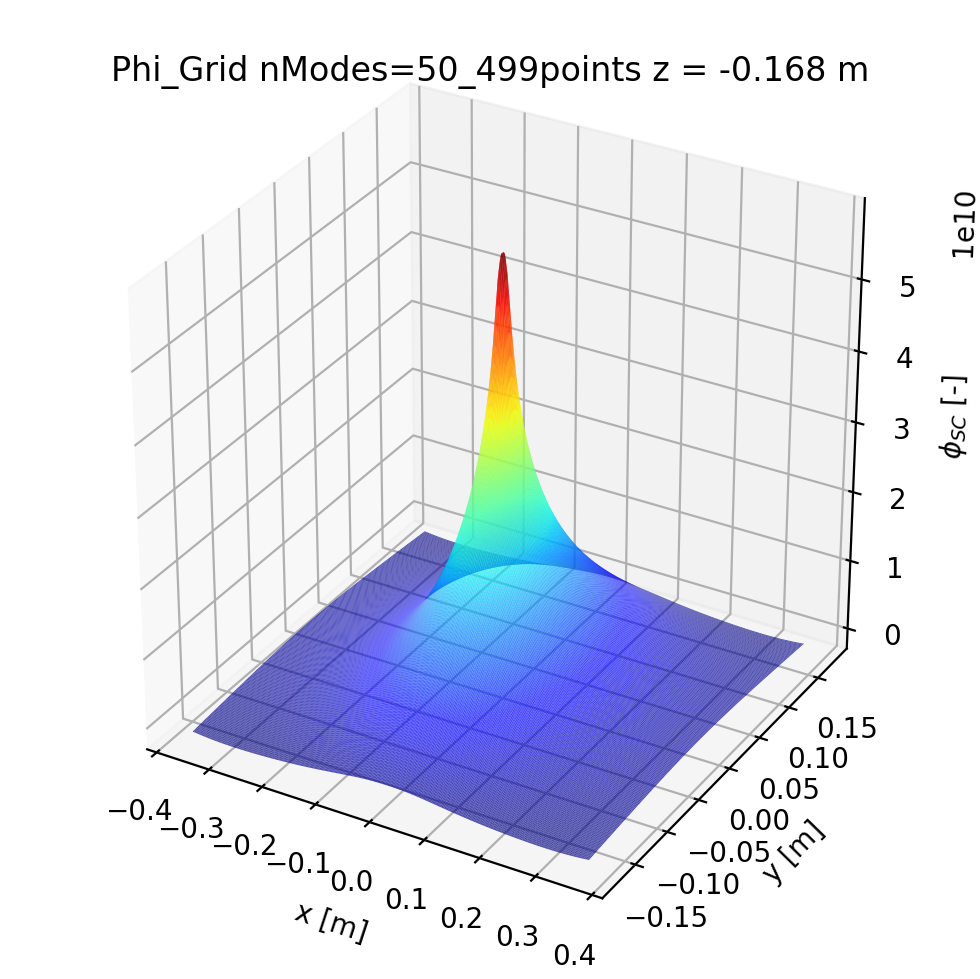

1

In [464]:
test4.plot_xy_phi_surface(31, title='Phi_Grid', label='nModes=50_499points', save=False, savename='Phi_Grid_nmodes50_499points.png')

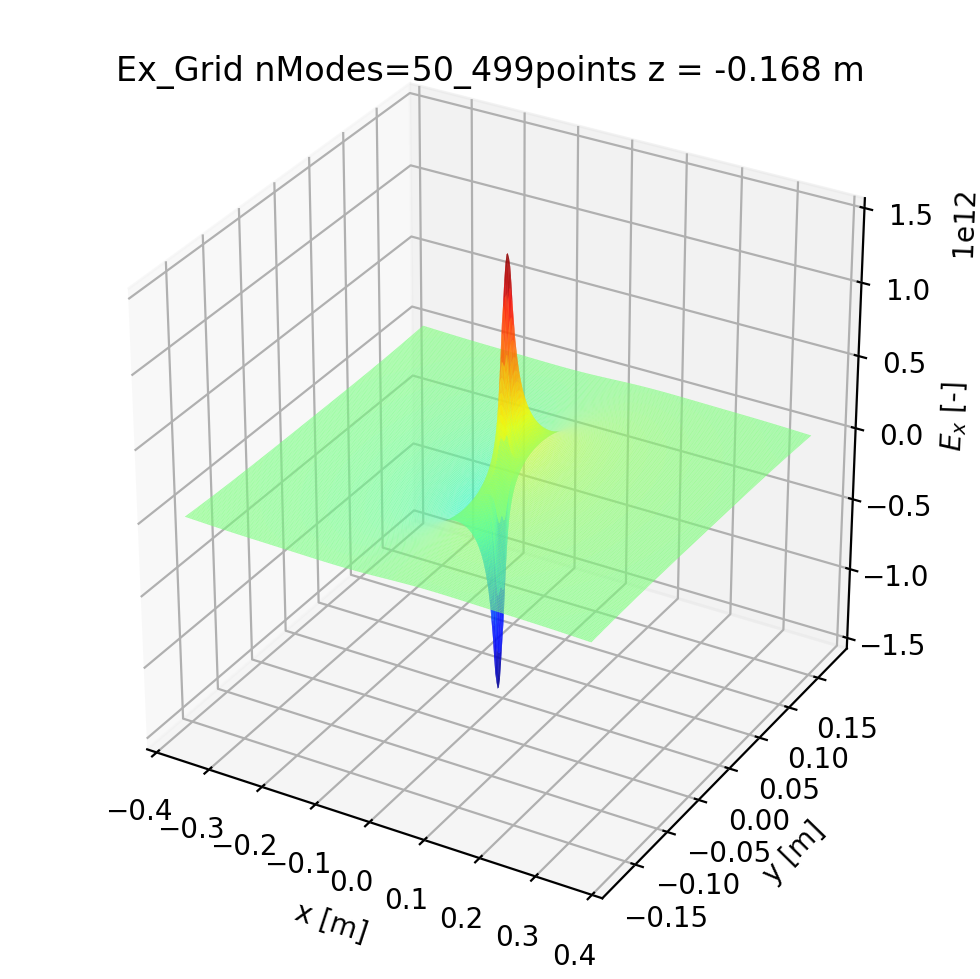

1

In [465]:
test4.plot_xy_Ex_surface(31, title='Ex_Grid', label='nModes=50_499points', save=False, savename='Ex_Grid_nmodes50_499points.png')

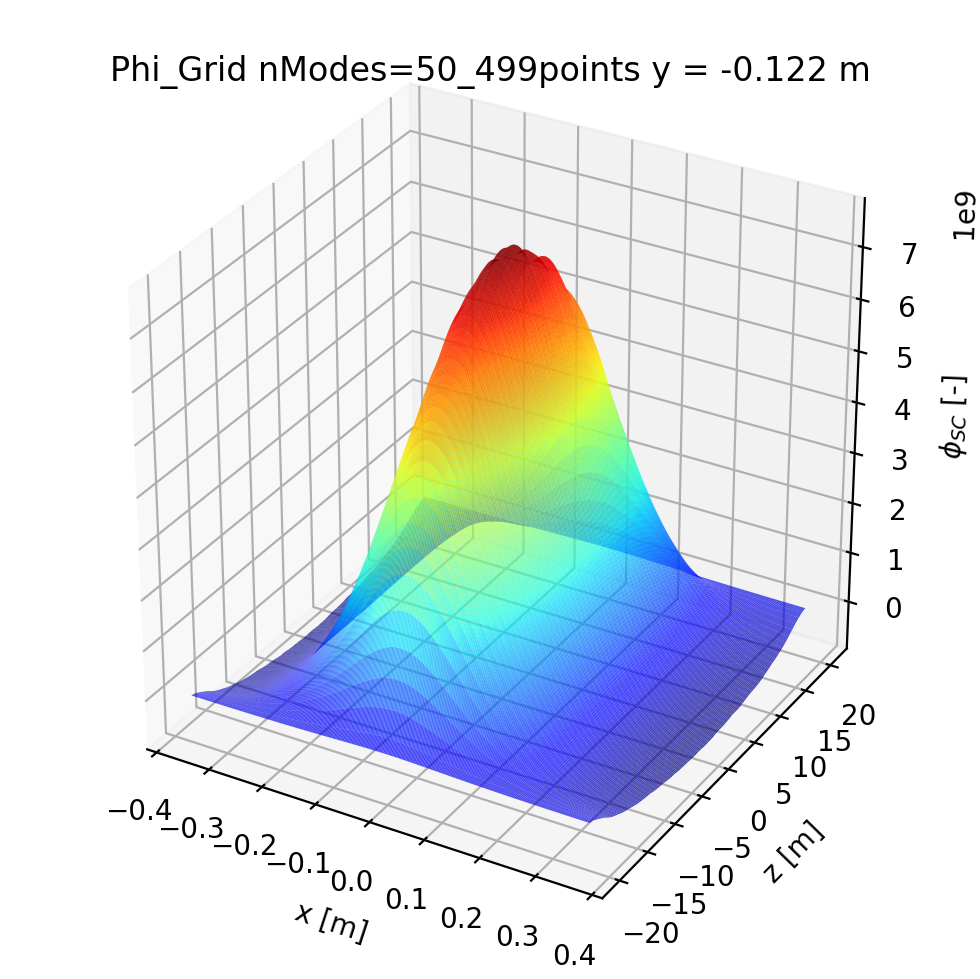

1

In [466]:
test4.plot_xz_phi_surface(31, title='Phi_Grid', label='nModes=50_499points', save=False, savename='Phi_Grid__xz_nmodes50_499points.png')

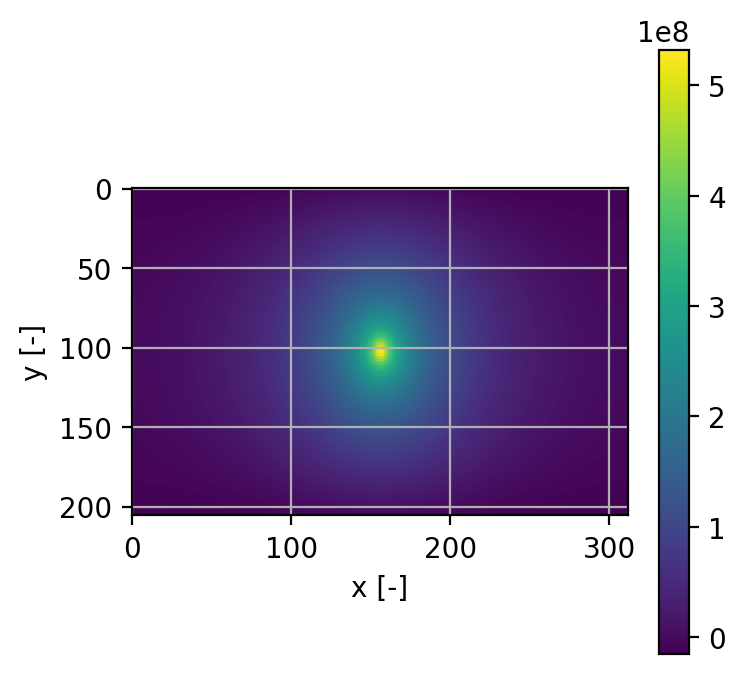

In [269]:
fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

pos = ax1.imshow(test_phi_grid)
fig1.colorbar(pos, ax=ax1)
ax1.set_ylabel('y [-]');
ax1.set_xlabel('x [-]');
ax1.grid()

# Plot x potential at centre y co-ordinate, for each z slice

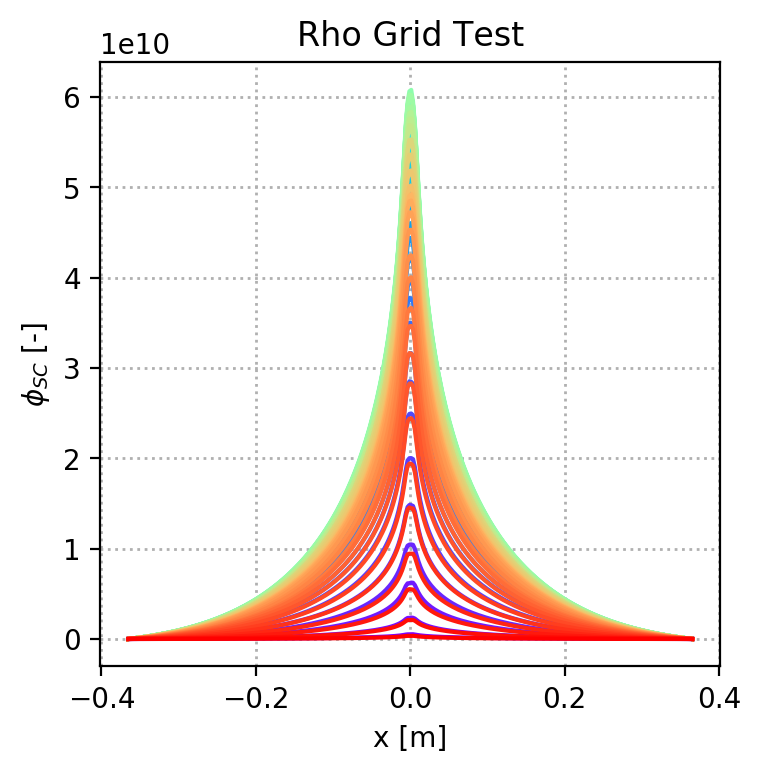

In [271]:
fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label
ax1.set_title(tit);

ax1.set_ylabel(r'$\phi_{SC}$ [-]');
ax1.set_xlabel('x [m]');

z_len = int(test.get_z_grid_length())

colors = matplotlib.cm.rainbow(np.linspace(0, 1, z_len))
c_it = int(0)

for iz in xrange(test.get_z_grid_length()):
    ax1.plot(test.get_x_coordinates(), test.get_phi_xy_grid(iz)[103], color=colors[c_it])
    c_it = c_it + 1;
    
#ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
#ax1.set_xlim(-1,turn_tot)

#savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
#plt.savefig(savename, dpi = 800);

## We can do this with slices of data

In [276]:
test_phi_slice = test.get_phi_x_slice(int(test.get_y_grid_length()/2), 0)

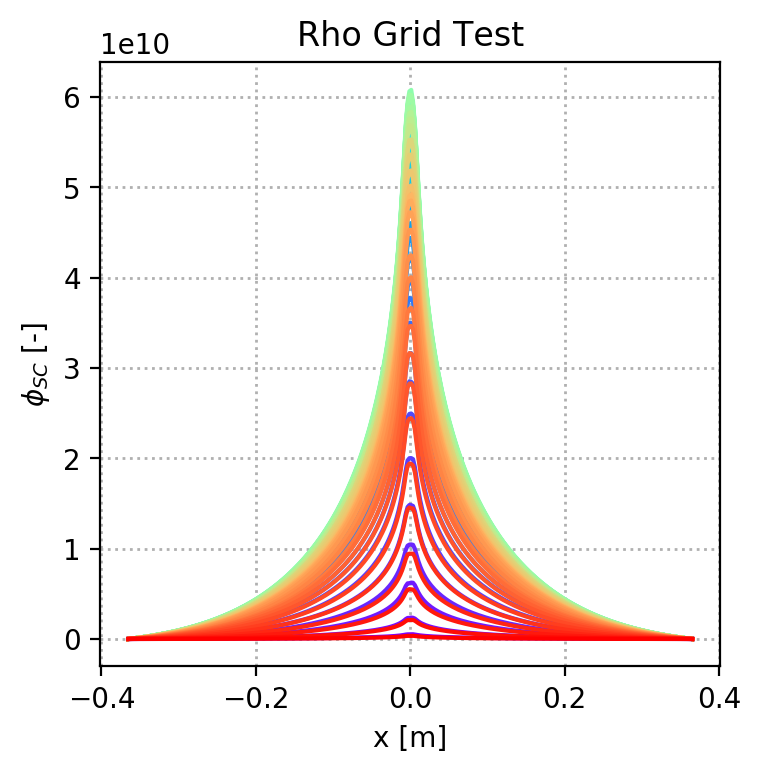

In [281]:
fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label
ax1.set_title(tit);

ax1.set_ylabel(r'$\phi_{SC}$ [-]');
ax1.set_xlabel('x [m]');

z_len = int(test.get_z_grid_length())

colors = matplotlib.cm.rainbow(np.linspace(0, 1, z_len))
c_it = int(0)

for iz in xrange(test.get_z_grid_length()):
    ax1.plot(test.get_x_coordinates(), test.get_phi_x_slice(int(test.get_y_grid_length()/2), iz), color=colors[c_it])
    c_it = c_it + 1;
    
#ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
#ax1.set_xlim(-1,turn_tot)

#savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
#plt.savefig(savename, dpi = 800);

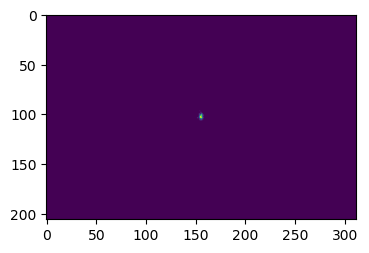

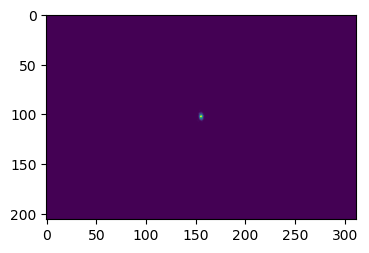

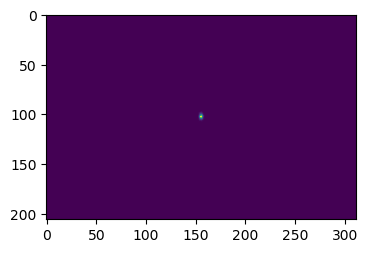

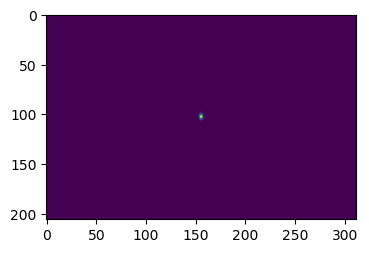

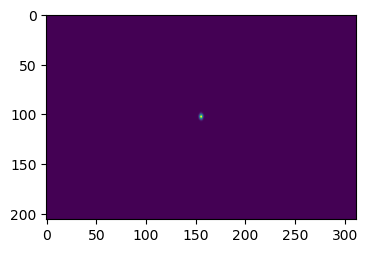

...

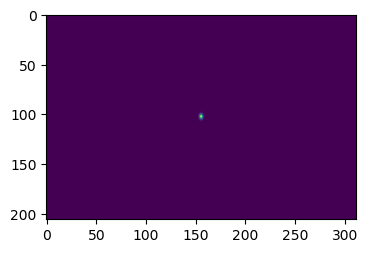

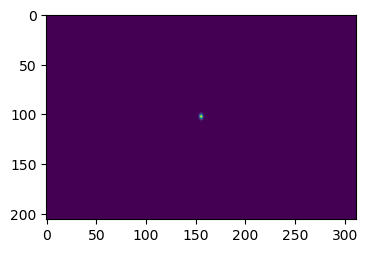

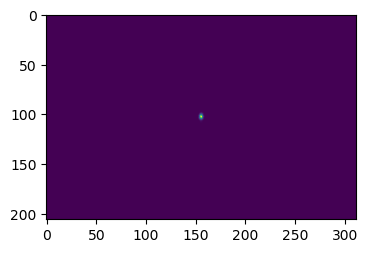

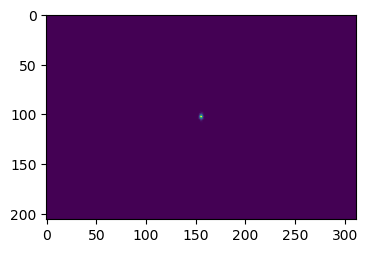

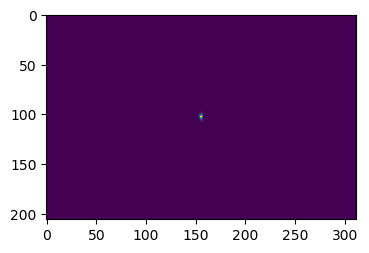

In [62]:
for iz in xrange(z_grid_len):
    for iy in xrange(y_grid_len):
        for ix in xrange(x_grid_len):
            #print ix, iy
            xy_[iy,ix] = dd_rho['Rho']['rho_grid'][ix][iy][iz]  
    plt.imshow(xy_)
    plt.show()

In [63]:
### Check size of charge density grid
rho_x_min = dd_rho['Rho']['x_grid'][0][0][0]
rho_x_max = dd_rho['Rho']['x_grid'][x_grid_len-1][0][0]
print 'x_min = ', rho_x_min, ' m'
print 'x_max = ', rho_x_max, ' m'

rho_y_min = dd_rho['Rho']['y_grid'][0][0][0]
rho_y_max = dd_rho['Rho']['y_grid'][0][y_grid_len-1][0]
print 'y_min = ', rho_y_min, ' m'
print 'y_max = ', rho_y_max, ' m'


rho_z_min = dd_rho['Rho']['z_grid'][0][0][0]
rho_z_max = dd_rho['Rho']['z_grid'][0][0][z_grid_len-1]
print 'z_min = ', rho_z_min, ' m'
print 'z_max = ', rho_z_max, ' m'

x_min =  -0.365  m
x_max =  0.365  m
y_min =  -0.175  m
y_max =  0.175  m
z_min =  -20.09981017398953  m
z_max =  20.39783837832807  m


## Plot Space Charge Potential (Phi) Grid for each z slice

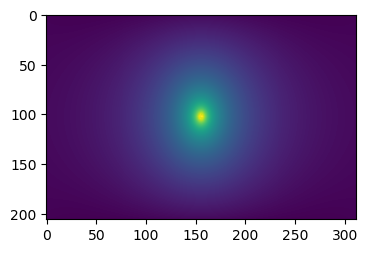

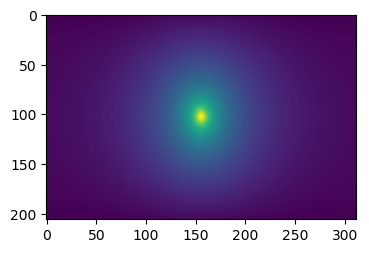

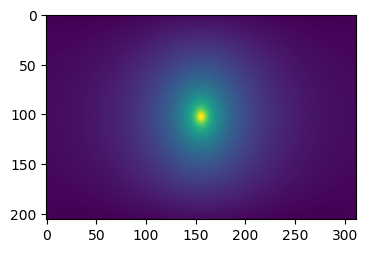

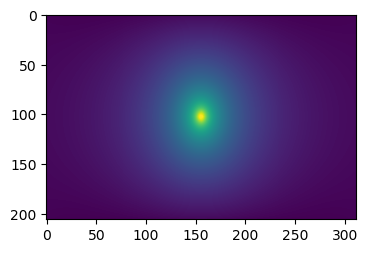

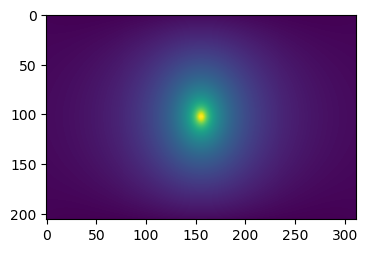

...

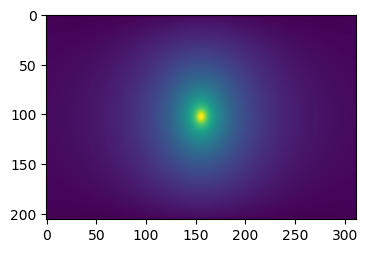

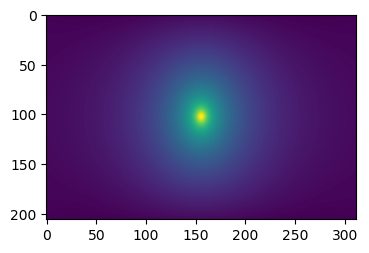

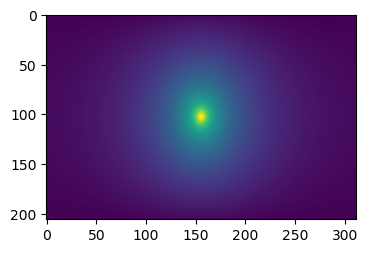

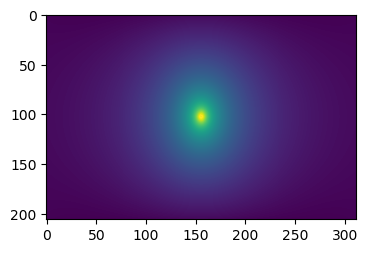

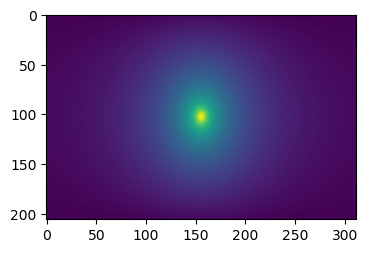

In [64]:
for iz in xrange(z_grid_len):
    for iy in xrange(y_grid_len):
        for ix in xrange(x_grid_len):
            #print ix, iy
            xy_[iy,ix] = dd_phi['Phi']['phi_grid'][ix][iy][iz]  
    plt.imshow(xy_)
    plt.show()

In [65]:
### Check size of charge density grid
phi_x_min = dd_phi['Phi']['x_grid'][0][0][0]
phi_x_max = dd_phi['Phi']['x_grid'][x_grid_len-1][0][0]
print 'x_min = ', phi_x_min, ' m'
print 'x_max = ', phi_x_max, ' m'

phi_y_min = dd_phi['Phi']['y_grid'][0][0][0]
phi_y_max = dd_phi['Phi']['y_grid'][0][y_grid_len-1][0]
print 'y_min = ', phi_y_min, ' m'
print 'y_max = ', phi_y_max, ' m'


phi_z_min = dd_phi['Phi']['z_grid'][0][0][0]
phi_z_max = dd_phi['Phi']['z_grid'][0][0][z_grid_len-1]
print 'z_min = ', phi_z_min, ' m'
print 'z_max = ', phi_z_max, ' m'

x_min =  -0.365  m
x_max =  0.365  m
y_min =  -0.175  m
y_max =  0.175  m
z_min =  -20.09981017398953  m
z_max =  20.39783837832807  m


## Plot the E_x field for each z slice

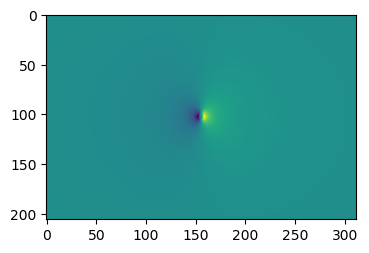

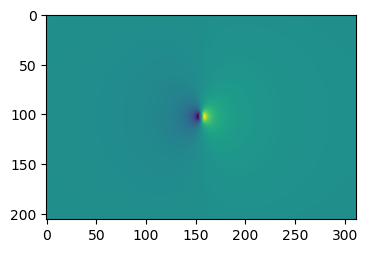

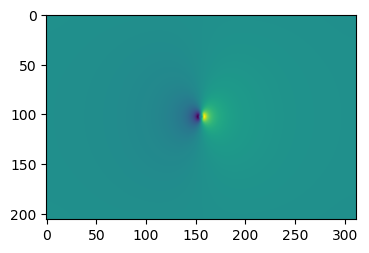

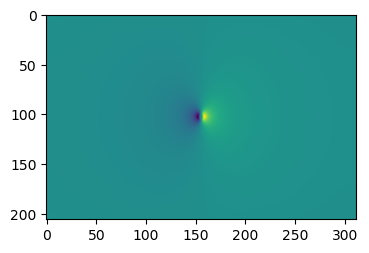

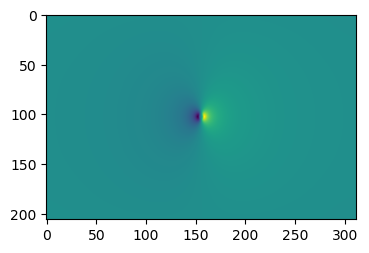

...

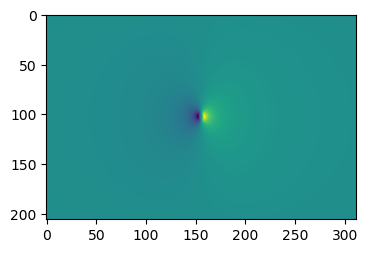

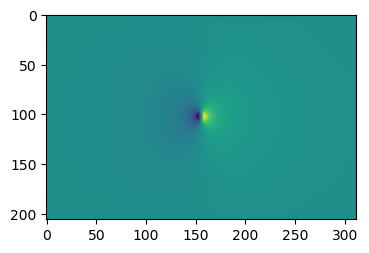

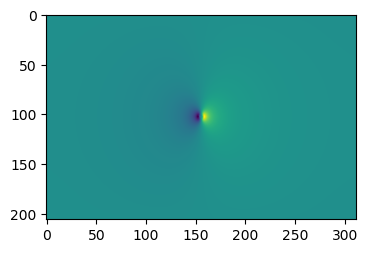

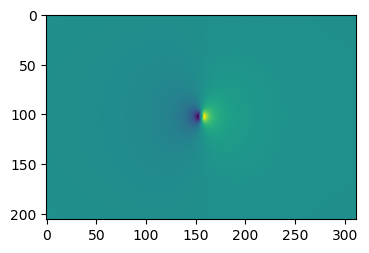

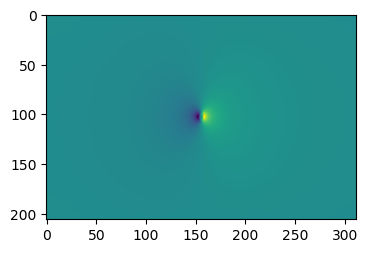

In [66]:
for iz in xrange(z_grid_len):
    for iy in xrange(y_grid_len):
        for ix in xrange(x_grid_len):
            #print ix, iy
            xy_[iy,ix] = dd_phi['Phi']['Ex_grid'][ix][iy][iz]  
    plt.imshow(xy_)
    plt.show()

## Plot the x potential for each z slice

ValueError: x and y must have same first dimension, but have shapes (311,) and (312,)

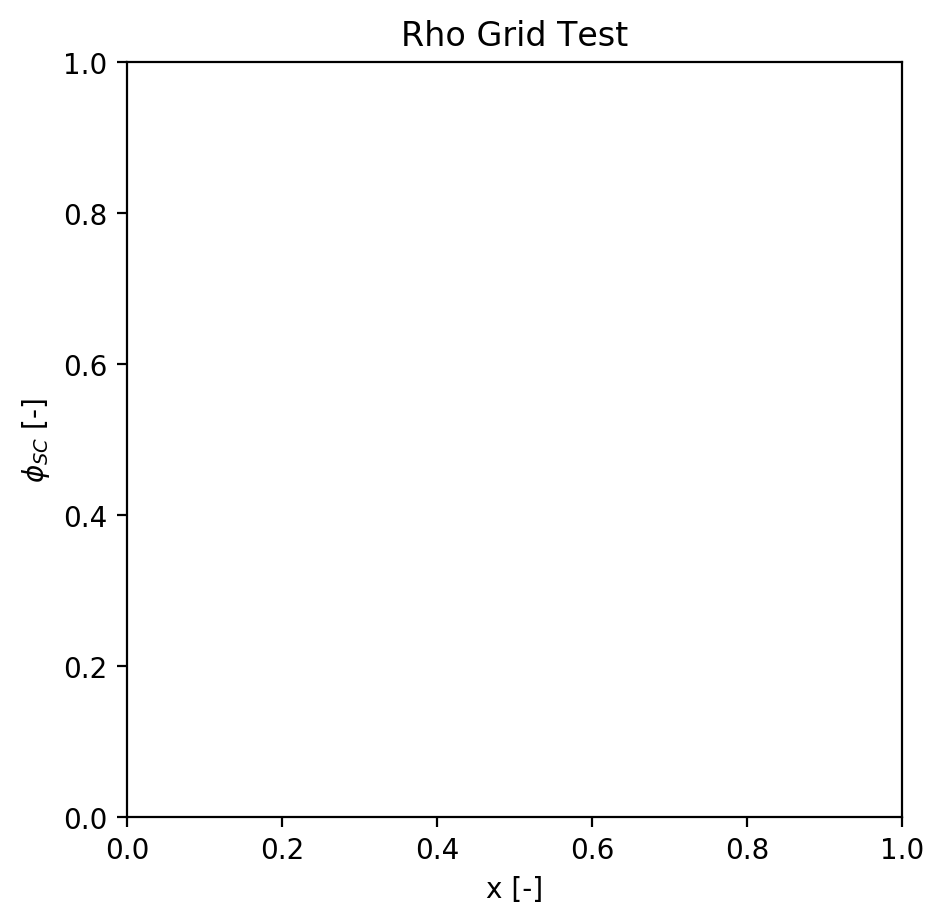

In [54]:
fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label
ax1.set_title(tit);

ax1.set_ylabel(r'$\phi_{SC}$ [-]');
ax1.set_xlabel('x [-]');

for iz in xrange(z_grid_len):
    y_dat = []
    for ix in xrange(x_grid_len): 
        y_dat.append(dd_phi['Phi']['phi_grid'][ix][102][iz])    
    ax1.plot(x_, y_dat)

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
ax1.set_xlim(-1,turn_tot)

#savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
#plt.savefig(savename, dpi = 800);

In [ ]:
xx_, yy_ = np.meshgrid(x_, y_)
np.shape(xx_)

In [ ]:
xx_

In [ ]:
fig1 = plt.figure(facecolor='w', edgecolor='k')
#ax1 = fig1.add_subplot(111)
ax1 = fig1.add_subplot(111, projection='3d')

tit = main_label
ax1.set_title(tit);

ax1.set_ylabel(r't$_{turn}$ [s]');
ax1.set_xlabel('Turn [-]');

surf = ax1.plot_surface(xx_, yy_, xy_, rstride=1, cstride=1, cmap=cm.jet, linewidth=0.2, antialiased=True, alpha=.7)
ax1.view_init(elev=20., azim=119)
ax1.set_xlabel('x [m]')
ax1.set_ylabel('y [m]')
ax1.set_zlabel(zlabel)

        
ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
ax1.set_xlim(-1,turn_tot)

#savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
#plt.savefig(savename, dpi = 800);

In [ ]:
for iz in xrange(z_grid_len):
    for iy in xrange(y_grid_len):
        for ix in xrange(x_grid_len):
            #print ix, iy
            xy_[iy,ix] = dd_phi['Phi']['Ex_grid'][ix][iy][iz]  
    plt.imshow(xy_)
    plt.show()

In [ ]:
## We need a surface plot - x,y must be 2D arrays

In [ ]:
x_ = np.linspace(0,311)
y_ = np.linspace(0,205)
z_ = np.linspace(0,63)



In [ ]:
len(dd['Test']['x_grid'])

In [ ]:
x_grid = []
for ix in xrange(len(dd['Test']['x_grid'])):
    x_grid.append(dd['Test']['x_grid'][ix][0][0])
    
x_grid = np.array(x_grid)

xx_grid = []
for ix in xrange(len(dd['Test']['x_grid'])):
    xx_grid.append(x_grid)
    
xx_grid = np.array(xx_grid)

In [ ]:
xx_grid[311]

In [ ]:
y_grid = []
for iy in xrange(len(dd['Test']['y_grid'][0])):
    y_grid.append(dd['Test']['y_grid'][0][iy][0])
    
y_grid = np.array(y_grid)

yy_grid = []
for iy in xrange(len(dd['Test']['y_grid'])):
    yy_grid.append(y_grid)
    
yy_grid = np.array(yy_grid)

In [ ]:
len(yy_grid)

In [ ]:
yy_grid[0]

In [ ]:
z_grid = []
for iz in xrange(len(dd['Test']['z_grid'][0])):
    z_grid.append(dd['Test']['z_grid'][0][iz][0])
    
z_grid = np.array(z_grid)

zz_grid = []
for iz in xrange(len(dd['Test']['z_grid'])):
    zz_grid.append(z_grid)
    
zz_grid = np.array(zz_grid)

In [ ]:
len(zz_grid)

In [ ]:
zz_grid[0]

In [ ]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Grab some test data.
X, Y, Z = axes3d.get_test_data(0.05)

# Plot a basic wireframe.
ax.plot_wireframe(X, Y, Z, rstride=10, cstride=10)

plt.show()

In [ ]:
fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label
ax1.set_title(tit);

ax1.set_ylabel(r't$_{turn}$ [s]');
ax1.set_xlabel('Turn [-]');

surf = ax.plot_surface(xx_grid, yy_grid, dd['Test']['rho_grid'][0], rstride=1, cstride=1, cmap=cm.jet, linewidth=0.2, antialiased=True, alpha=.7)
ax.view_init(elev=20., azim=119)
ax.set_xlabel('x [m]')
ax.set_ylabel('y [m]')
ax.set_zlabel(zlabel)

        
ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
ax1.set_xlim(-1,turn_tot)

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.savefig(savename, dpi = 800);

In [ ]:
fig = plt.figure(4)
fig.clf()
ax = fig.gca(projection='3d')
# value_grid[value_grid<0] = 0
surf = ax.plot_trisurf(dd['Test']['x_grid'][0], dd['Test']['x_grid'][1],dd['Test']['x_grid'][2], rstride=1, cstride=1, cmap=cm.jet, antialiased=True, alpha=.7)
ax.view_init(elev=20., azim=119)
ax.set_xlabel('x [m]')
ax.set_ylabel('y [m]')
ax.set_zlabel(zlabel)
plt.show()
plt.savefig("test_2d.png")

In [ ]:
#Horizontal Scan No Space Charge

# Create dd dictionary
dd3 = dict()

dd3 = add_input_file(dd3, 'Run2_Standard/output/output.mat', 'Run2 Std')
dd3 = add_input_file(dd3, 'Run2_BCMS/output/output.mat', 'Run2 BCMS')
dd3 = add_input_file(dd3, 'Run3_Standard_2021/output/output.mat', 'LIU Std 2021')
dd3 = add_input_file(dd3, 'Run3_Standard_2022/output/output.mat', 'LIU Std 2022')
dd3 = add_input_file(dd3, 'Run3_Standard_2023/output/output.mat', 'LIU Std 2023')
dd3 = add_input_file(dd3, 'Run3_BCMS/output/output.mat', 'LIU BCMS')

### Plot Parameters

In [ ]:
save_folder = 'Plots/'

sc = 'SbS'
legend_label = 'Case' # r'$\frac{\delta p}{p_0}$'
main_label = 'PS_Injection_IB_5%'
main_label2 = main_label + '_zoom'
scaled_label = main_label + '_scaled'
turn_tot = 2200
zoom_turns = 50
betagamma = 2.492104532 * 0.9159915293879255

In [ ]:
dd3['Run2 Std'].keys()

In [ ]:
parameter = 'turn_duration'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + sc + ' ' + parameter
ax1.set_title(tit);

ax1.set_ylabel(r't$_{turn}$ [s]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)

for key, value in sorted(dd3.iteritems()):
        ax1.plot(dd3[key]['turn'][0], dd3[key][parameter][0], label=key, color=colors[c_it]);
        c_it = c_it + 1;
        
ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
ax1.set_xlim(-1,turn_tot)

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.savefig(savename, dpi = 800);

In [ ]:
parameter = 'intensity'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + sc + ' ' + parameter
ax1.set_title(tit);

ax1.set_ylabel('I [protons]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)

for key, value in sorted(dd3.iteritems()):
        ax1.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*1000, label=key, color=colors[c_it]);
        c_it = c_it + 1;
        
ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
ax1.set_xlim(-1,turn_tot)

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.savefig(savename, dpi = 800);

In [ ]:
parameter = 'n_mp'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + sc + ' ' + parameter
ax1.set_title(tit);

ax1.set_ylabel(r'$N_{macroparticles}$ [-]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)

for key, value in sorted(dd3.iteritems()):
        ax1.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*1000, label=key, color=colors[c_it]);
        c_it = c_it + 1;
        
ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
ax1.set_xlim(-1,turn_tot)

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.savefig(savename, dpi = 800);

In [ ]:
parameter = 'sig_x'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + sc + ' ' + parameter
ax1.set_title(tit);

ax1.set_ylabel(r'$\sigma_x$ [mm]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)

for key, value in sorted(dd3.iteritems()):
        ax1.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*1000, label=key, color=colors[c_it]);
        c_it = c_it + 1;
        
ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
ax1.set_xlim(-1,turn_tot)

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.savefig(savename, dpi = 800);

In [ ]:
parameter = 'sig_y'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + sc + ' ' + parameter
ax1.set_title(tit);

ax1.set_ylabel(r'$\sigma_y$ [mm]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)

for key, value in sorted(dd3.iteritems()):
        ax1.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*1000, label=key, color=colors[c_it]);
        c_it = c_it + 1;
        
ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
ax1.set_xlim(-1,turn_tot)

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.savefig(savename, dpi = 800);

In [ ]:
parameter = 'dpp_rms'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + sc + ' ' + parameter
ax1.set_title(tit);

ax1.set_ylabel(r'$\frac{\delta p}{p_0}_{RMS}$ [MeV]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)

for key, value in sorted(dd3.iteritems()):
        ax1.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*1E3, label=key, color=colors[c_it]);
        c_it = c_it + 1;
        
ax1.legend(loc=1);
ax1.grid(lw=1, ls=':');
ax1.set_xlim(-1,turn_tot)

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.savefig(savename, dpi = 800);

In [ ]:
parameter = 'bunchlength'
multi1 = 1E9

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + sc + ' ' + parameter
ax1.set_title(tit);

ax1.set_ylabel(r'$B_l$ [ns]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)

for key, value in sorted(dd3.iteritems()):  
        av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
        rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
        print key, 'Average ', parameter, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'    
        lab_ = key + ' ' + str(round_sig(rang_,3)) + ' ns'           
        ax1.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
        c_it = c_it + 1;
        
ax1.legend(loc=1);
ax1.grid(lw=1, ls=':');
ax1.set_xlim(-1,turn_tot)

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.savefig(savename, dpi = 800);

In [ ]:
parameter = 'beta_x'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + sc + ' ' + parameter
ax1.set_title(tit);

ax1.set_ylabel(r'$\beta_{x}$ [m]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)

for key, value in sorted(dd3.iteritems()):
        ax1.plot(dd3[key]['turn'][0], dd3[key][parameter][0], label=key, color=colors[c_it]);
        c_it = c_it + 1;
        
ax1.legend(loc=1);
ax1.grid(lw=1, ls=':');
ax1.set_xlim(-1,turn_tot)

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.savefig(savename, dpi = 800);

In [ ]:
parameter = 'beta_y'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + sc + ' ' + parameter
ax1.set_title(tit);

ax1.set_ylabel(r'$\beta_{x}$ [m]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)

for key, value in sorted(dd3.iteritems()):
        ax1.plot(dd3[key]['turn'][0], dd3[key][parameter][0], label=key, color=colors[c_it]);
        c_it = c_it + 1;
        
ax1.legend(loc=1);
ax1.grid(lw=1, ls=':');
ax1.set_xlim(-1,turn_tot)

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.savefig(savename, dpi = 800);

In [ ]:
parameter = 'epsn_x'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + sc + ' ' + parameter
ax1.set_title(tit);

ax1.set_ylabel(r'$\epsilon_{x_{RMS}}$ [mm mrad]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)

for key, value in sorted(dd3.iteritems()):
        ax1.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*1E6, label=key, color=colors[c_it]);
        av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
        rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
        print key, 'Average ', parameter, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'    
        c_it = c_it + 1;
        
ax1.legend(loc=1);
ax1.grid(lw=1, ls=':');
ax1.set_xlim(-1,turn_tot)

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.savefig(savename, dpi = 800);

In [ ]:
parameter = 'epsn_y'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + sc + ' ' + parameter
ax1.set_title(tit);

ax1.set_ylabel(r'$\epsilon_{y_{RMS}}$ [mm mrad]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)

for key, value in sorted(dd3.iteritems()):
        ax1.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*1E6, label=key, color=colors[c_it]);
        av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
        rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
        print key, 'Average ', parameter, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'    
        c_it = c_it + 1;
        
ax1.legend(loc=1);
ax1.grid(lw=1, ls=':');
ax1.set_xlim(-1,turn_tot)

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.savefig(savename, dpi = 800);

In [ ]:
parameter1 = 'epsn_x'
multi1 = 1E6
parameter2 = 'epsn_y'
multi2 = 1E6

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + sc + ' average emittance'
ax1.set_title(tit);

ax1.set_ylabel(r'$\frac{ \epsilon_{x_{RMS}} + \epsilon_{y_{RMS}} }{2}$ [mm mrad]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)

for key, value in sorted(dd3.iteritems()):
        x = np.array(dd3[key]['turn'][0])
        y = np.array((dd3[key][parameter1][0]*multi1 + dd3[key][parameter2][0]*multi2)/2)
        ax1.plot(x, y, label=key, color=colors[c_it]);
        av_ = np.mean(y[-100])
        rang_ = np.abs(np.max(y) - np.min(y))
        print key, 'Average ', parameter, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'    
        c_it = c_it + 1;
        
ax1.legend(loc=1);
ax1.grid(lw=1, ls=':');
ax1.set_xlim(-1,turn_tot)

savename = save_folder + '/'+ main_label + '_average_emittance.png'
plt.savefig(savename, dpi = 800);

In [ ]:
parameter = 'D_x'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + sc + ' ' + parameter
ax1.set_title(tit);

ax1.set_ylabel(r'$D_{x}$ [m]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)

for key, value in sorted(dd3.iteritems()):
        ax1.plot(dd3[key]['turn'][0], dd3[key][parameter][0], label=key, color=colors[c_it]);
        c_it = c_it + 1;
        
ax1.legend(loc=1);
ax1.grid(lw=1, ls=':');
ax1.set_xlim(-1,turn_tot)

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.savefig(savename, dpi = 800);

In [ ]:
parameter = 'D_y'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + sc + ' ' + parameter
ax1.set_title(tit);

ax1.set_ylabel(r'$D_{y}$ [m]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)

for key, value in sorted(dd3.iteritems()):
        ax1.plot(dd3[key]['turn'][0], dd3[key][parameter][0], label=key, color=colors[c_it]);
        c_it = c_it + 1;
        
ax1.legend(loc=1);
ax1.grid(lw=1, ls=':');
ax1.set_xlim(-1,turn_tot)

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.savefig(savename, dpi = 800);

# Compare individual cases

## Run2 Standard

In [ ]:
# Create dd dictionary
dd = dict()

run_lab = 'Run2_Std'

dd = add_input_file(dd, 'Run2_Standard/output/output.mat', 'Run2 Std')
dd = add_input_file(dd, '../19_SC_Mini/Run2_Standard/output/output.mat', 'Run2 Std Old')

In [ ]:
parameter = 'bunchlength'
multi1 = 1E9

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + sc + ' ' + parameter
ax1.set_title(tit);

ax1.set_ylabel(r'$B_l$ [ns]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd.keys())))
c_it = int(0)

for key, value in sorted(dd.iteritems()):
        av_ = np.mean(dd[key][parameter][0][-100]*multi1)
        rang_ = np.abs(np.max(dd[key][parameter][0]*multi1) - np.min(dd[key][parameter][0]*multi1))
        print key, 'Average ', parameter, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%' 
        lab_ = key + ' ' + str(round_sig(rang_,3)) + ' ns'
        ax1.plot(dd[key]['turn'][0], dd[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
   
        c_it = c_it + 1;
        
ax1.legend(loc=1);
ax1.grid(lw=1, ls=':');
ax1.set_xlim(-1,turn_tot)

savename = save_folder + '/'+ run_lab + '_' + parameter + '.png'
plt.savefig(savename, dpi = 800);

## Run 2 BCMS

In [ ]:
# Create dd dictionary
dd = dict()
run_lab = 'Run2_BCMS'
dd = add_input_file(dd, 'Run2_BCMS/output/output.mat', 'Run2 BCMS')
dd = add_input_file(dd, '../19_SC_Mini/Run2_BCMS/output/output.mat', 'Run2 BCMS Old')

In [ ]:
parameter = 'bunchlength'
multi1 = 1E9

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + sc + ' ' + parameter
ax1.set_title(tit);

ax1.set_ylabel(r'$B_l$ [ns]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd.keys())))
c_it = int(0)

for key, value in sorted(dd.iteritems()):
        av_ = np.mean(dd[key][parameter][0][-100]*multi1)
        rang_ = np.abs(np.max(dd[key][parameter][0]*multi1) - np.min(dd[key][parameter][0]*multi1))
        print key, 'Average ', parameter, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%' 
        lab_ = key + ' ' + str(round_sig(rang_,3)) + ' ns'
        ax1.plot(dd[key]['turn'][0], dd[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
   
        c_it = c_it + 1;
        
ax1.legend(loc=1);
ax1.grid(lw=1, ls=':');
ax1.set_xlim(-1,turn_tot)

savename = save_folder + '/'+ run_lab + '_' + parameter + '.png'
plt.savefig(savename, dpi = 800);

## Run 3 BCMS

In [ ]:
# Create dd dictionary
dd = dict()
run_lab = 'Run3_BCMS'
dd = add_input_file(dd, 'Run3_BCMS/output/output.mat', 'Run3 BCMS')
dd = add_input_file(dd, '../19_SC_Mini/Run3_BCMS/output/output.mat', 'Run3 BCMS Old')

In [ ]:
parameter = 'bunchlength'
multi1 = 1E9

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + sc + ' ' + parameter
ax1.set_title(tit);

ax1.set_ylabel(r'$B_l$ [ns]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd.keys())))
c_it = int(0)

for key, value in sorted(dd.iteritems()):
        av_ = np.mean(dd[key][parameter][0][-100]*multi1)
        rang_ = np.abs(np.max(dd[key][parameter][0]*multi1) - np.min(dd[key][parameter][0]*multi1))
        print key, 'Average ', parameter, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%' 
        lab_ = key + ' ' + str(round_sig(rang_,3)) + ' ns'
        ax1.plot(dd[key]['turn'][0], dd[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
   
        c_it = c_it + 1;
        
ax1.legend(loc=1);
ax1.grid(lw=1, ls=':');
ax1.set_xlim(-1,turn_tot)

savename = save_folder + '/'+ run_lab + '_' + parameter + '.png'
plt.savefig(savename, dpi = 800);

# Run 3 Std 2021

In [ ]:
# Create dd dictionary
dd = dict()
run_lab = 'Run3_Std_2021'
dd = add_input_file(dd, 'Run3_Standard_2021/output/output.mat', 'Run3 Std 2021')
dd = add_input_file(dd, '../19_SC_Mini/Run3_Standard_2021/output/output.mat', 'Run3 Std 2021 Old')

In [ ]:
parameter = 'bunchlength'
multi1 = 1E9

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + sc + ' ' + parameter
ax1.set_title(tit);

ax1.set_ylabel(r'$B_l$ [ns]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd.keys())))
c_it = int(0)

for key, value in sorted(dd.iteritems()):
        av_ = np.mean(dd[key][parameter][0][-100]*multi1)
        rang_ = np.abs(np.max(dd[key][parameter][0]*multi1) - np.min(dd[key][parameter][0]*multi1))
        print key, 'Average ', parameter, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%' 
        lab_ = key + ' ' + str(round_sig(rang_,3)) + ' ns'
        ax1.plot(dd[key]['turn'][0], dd[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
   
        c_it = c_it + 1;
        
ax1.legend(loc=1);
ax1.grid(lw=1, ls=':');
ax1.set_xlim(-1,turn_tot)

savename = save_folder + '/'+ run_lab + '_' + parameter + '.png'
plt.savefig(savename, dpi = 800);

# Run 3 Std 2022

In [ ]:
# Create dd dictionary
dd = dict()
run_lab = 'Run3_Std_2022'
dd = add_input_file(dd, 'Run3_Standard_2022/output/output.mat', 'Run3 Std 2022')
dd = add_input_file(dd, '../19_SC_Mini/Run3_Standard_2022/output/output.mat', 'Run3 Std 2022 Old')

In [ ]:
parameter = 'bunchlength'
multi1 = 1E9

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + sc + ' ' + parameter
ax1.set_title(tit);

ax1.set_ylabel(r'$B_l$ [ns]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd.keys())))
c_it = int(0)

for key, value in sorted(dd.iteritems()):
        av_ = np.mean(dd[key][parameter][0][-100]*multi1)
        rang_ = np.abs(np.max(dd[key][parameter][0]*multi1) - np.min(dd[key][parameter][0]*multi1))
        print key, 'Average ', parameter, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%' 
        lab_ = key + ' ' + str(round_sig(rang_,3)) + ' ns'
        ax1.plot(dd[key]['turn'][0], dd[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
   
        c_it = c_it + 1;
        
ax1.legend(loc=1);
ax1.grid(lw=1, ls=':');
ax1.set_xlim(-1,turn_tot)

savename = save_folder + '/'+ run_lab + '_' + parameter + '.png'
plt.savefig(savename, dpi = 800);

# Run 3 Std 2023

In [ ]:
# Create dd dictionary
dd = dict()
run_lab = 'Run3_Std_2023'
dd = add_input_file(dd, 'Run3_Standard_2023/output/output.mat', 'Run3 Std 2023')
dd = add_input_file(dd, '../19_SC_Mini/Run3_Standard_2023/output/output.mat', 'Run3 Std 2023 Old')

In [ ]:
parameter = 'bunchlength'
multi1 = 1E9

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + sc + ' ' + parameter
ax1.set_title(tit);

ax1.set_ylabel(r'$B_l$ [ns]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd.keys())))
c_it = int(0)

for key, value in sorted(dd.iteritems()):
        av_ = np.mean(dd[key][parameter][0][-100]*multi1)
        rang_ = np.abs(np.max(dd[key][parameter][0]*multi1) - np.min(dd[key][parameter][0]*multi1))
        print key, 'Average ', parameter, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%' 
        lab_ = key + ' ' + str(round_sig(rang_,3)) + ' ns'
        ax1.plot(dd[key]['turn'][0], dd[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
   
        c_it = c_it + 1;
        
ax1.legend(loc=1);
ax1.grid(lw=1, ls=':');
ax1.set_xlim(-1,turn_tot)

savename = save_folder + '/'+ run_lab + '_' + parameter + '.png'
plt.savefig(savename, dpi = 800);

# Plots for IPP talk

In [ ]:
plt.rcParams['figure.figsize'] = [5.0, 4.5]
plt.rcParams['figure.dpi'] = 200
plt.rcParams['savefig.dpi'] = 200

plt.rcParams['axes.titlesize'] = 14
plt.rcParams['axes.labelsize'] = 14

plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10

plt.rcParams['font.size'] = 10
plt.rcParams['legend.fontsize'] = 12

plt.rcParams['lines.linewidth'] = 2
plt.rcParams['lines.markersize'] = 5

In [ ]:
dd = dict()

dd = add_input_file(dd, 'Run2_Standard/output/output.mat', '00 Run2 Standard')
#dd = add_input_file(dd, 'Run2_BCMS/output/output.mat', '01 Run2 BCMS')

#dd = add_input_file(dd, 'Run3_BCMS/output/output.mat', '02 LIU BCMS')

#dd = add_input_file(dd, 'Run3_Standard_2021/output/output.mat', '03 LIU Standard 2021')
#dd = add_input_file(dd, 'Run3_Standard_2022/output/output.mat', '04 LIU Standard 2022')
#dd = add_input_file(dd, 'Run3_Standard_2023/output/output.mat', '05 LIU Standard 2023')

parameter1 = 'epsn_x'
multi1 = 1E6

fig, ax1 = plt.subplots();
#ax1.set_title('PyORBIT Output: BLonD Input Test')

savename = save_folder +'/' + main_label + '_' +  parameter1 + '_' + str(len(dd))+'.png'

ax1.set_xlabel('Turn [-]')
ax1.set_ylabel(r'$\epsilon_x$ [mm mrad]');


colors = cm.rainbow(np.linspace(0, 1, 7))
c_it = int(0)

for key in sorted(dd.iterkeys()):
    eps_ov_eps_0 = 100*(np.mean(dd[key]['epsn_x'][0][-500:]) - dd[key]['epsn_x'][0][0])/(dd[key]['epsn_x'][0][0])
    # eps_ov_eps_0 = 100*(np.max(dd1[key]['epsn_x'][0]) - np.min(dd1[key]['epsn_x'][0]))/(dd1[key]['epsn_x'][0][0])
    #lab_ = key[3:] + r' $\frac{\Delta \epsilon_x}{\epsilon_{x_0}} = $' +str(round_sig(eps_ov_eps_0,2))+'%'
    lab_ = key[3:]
    ax1.plot(dd[key]['turn'][0], dd[key][parameter1][0]*multi1, color=colors[c_it], label=lab_);
    
    av_ = np.mean(dd[key][parameter1][0][-100]*multi1)
    rang_ = np.abs(np.max(dd[key][parameter1][0]*multi1) - np.min(dd[key][parameter1][0]*multi1))
    
    print key, 'Average ', parameter1, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    c_it = c_it + 1;

ax1.set_ylim(1.0, 2.4)
#ax1.legend(loc=10, framealpha=1.0)
ax1.grid(which='both', ls=':', lw=0.5)

plt.tight_layout()
fig.savefig(savename)








parameter1 = 'epsn_y'
multi1 = 1E6

fig, ax1 = plt.subplots();
#ax1.set_title('PyORBIT Output: BLonD Input Test')

savename = save_folder +'/' + main_label + '_' +  parameter1 + '_' + str(len(dd))+'.png'

ax1.set_xlabel('Turn [-]')
ax1.set_ylabel(r'$\epsilon_y$ [mm mrad]');


colors = cm.rainbow(np.linspace(0, 1, 7))
c_it = int(0)

for key in sorted(dd.iterkeys()):
    eps_ov_eps_0 = 100*(np.mean(dd[key]['epsn_y'][0][-500:]) - dd[key]['epsn_y'][0][0])/(dd[key]['epsn_y'][0][0])
    # eps_ov_eps_0 = 100*(np.max(dd1[key]['epsn_x'][0]) - np.min(dd1[key]['epsn_x'][0]))/(dd1[key]['epsn_x'][0][0])
    lab_ = key[3:] + r' $\frac{\Delta \epsilon_y}{\epsilon_{y_0}} = $' +str(round_sig(eps_ov_eps_0,2))+'%'

    ax1.plot(dd[key]['turn'][0], dd[key][parameter1][0]*multi1, color=colors[c_it], label=lab_);
    
    av_ = np.mean(dd[key][parameter1][0][-100]*multi1)
    rang_ = np.abs(np.max(dd[key][parameter1][0]*multi1) - np.min(dd[key][parameter1][0]*multi1))
    
    print key, 'Average ', parameter1, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    c_it = c_it + 1;

#ax1.legend(loc=10, framealpha=0.0)
ax1.grid(which='both', ls=':', lw=0.5)

ax1.set_ylim(1.0, 2.4)
plt.tight_layout()
fig.savefig(savename)









parameter1 = 'epsn_x'
parameter2 = 'epsn_y'
multi1 = 1E6

fig, ax1 = plt.subplots();
#ax1.set_title('PyORBIT Output: BLonD Input Test')

savename = save_folder +'/' + main_label + '_' +  parameter1 + '_average_' + str(len(dd))+'.png'

ax1.set_xlabel('Turn [-]')
ax1.set_ylabel(r'$\frac{ \epsilon_{x_{RMS}} + \epsilon_{y_{RMS}} }{2}$ [mm mrad]');


colors = cm.rainbow(np.linspace(0, 1, 7))
c_it = int(0)

for key in sorted(dd.iterkeys()):
    eps_ov_eps_0 = 100*(np.mean(dd[key]['epsn_y'][0][-500:]) - dd[key]['epsn_y'][0][0])/(dd[key]['epsn_y'][0][0])
    # eps_ov_eps_0 = 100*(np.max(dd1[key]['epsn_x'][0]) - np.min(dd1[key]['epsn_x'][0]))/(dd1[key]['epsn_x'][0][0])
    lab_ = key[3:] + r' $\frac{\Delta \epsilon_y}{\epsilon_{y_0}} = $' +str(round_sig(eps_ov_eps_0,2))+'%'

    ax1.plot(dd[key]['turn'][0], ((dd[key][parameter1][0]+dd[key][parameter2][0])*multi1)/2, color=colors[c_it], label=lab_);
    
    av_ = np.mean(dd[key][parameter1][0][-100]*multi1)
    rang_ = np.abs(np.max(dd[key][parameter1][0]*multi1) - np.min(dd[key][parameter1][0]*multi1))
    
    print key, 'Average ', parameter1, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    c_it = c_it + 1;

#ax1.legend(loc=10, framealpha=0.0)
ax1.grid(which='both', ls=':', lw=0.5)

ax1.set_ylim(1.0, 2.4)
plt.tight_layout()
fig.savefig(savename)






parameter1 = 'epsn_x'
multi1 = 1E6

fig, ax1 = plt.subplots();
#ax1.set_title('PyORBIT Output: BLonD Input Test')

savename = save_folder +'/' + main_label + '_' +  parameter1 + '_' + str(len(dd))+'_legend.png'

ax1.set_xlabel('Turn [-]')
ax1.set_ylabel(r'$\epsilon_x$ [mm mrad]');


colors = cm.rainbow(np.linspace(0, 1, 7))
c_it = int(0)

for key in sorted(dd.iterkeys()):
    eps_ov_eps_0 = 100*(np.mean(dd[key]['epsn_x'][0][-500:]) - dd[key]['epsn_x'][0][0])/(dd[key]['epsn_x'][0][0])
    # eps_ov_eps_0 = 100*(np.max(dd1[key]['epsn_x'][0]) - np.min(dd1[key]['epsn_x'][0]))/(dd1[key]['epsn_x'][0][0])
    #lab_ = key[3:] + r' $\frac{\Delta \epsilon_x}{\epsilon_{x_0}} = $' +str(round_sig(eps_ov_eps_0,2))+'%'
    lab_ = key[3:]
    ax1.plot(dd[key]['turn'][0], dd[key][parameter1][0]*multi1, color=colors[c_it], label=lab_);
    
    av_ = np.mean(dd[key][parameter1][0][-100]*multi1)
    rang_ = np.abs(np.max(dd[key][parameter1][0]*multi1) - np.min(dd[key][parameter1][0]*multi1))
    
    print key, 'Average ', parameter1, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    c_it = c_it + 1;

ax1.set_ylim(1.0, 2.4)
ax1.legend(loc=10, framealpha=1.0)
ax1.grid(which='both', ls=':', lw=0.5)

plt.tight_layout()
fig.savefig(savename)

In [ ]:
dd = dict()

dd = add_input_file(dd, 'Run2_Standard/output/output.mat', '00 Run2 Standard')
dd = add_input_file(dd, 'Run2_BCMS/output/output.mat', '01 Run2 BCMS')

#dd = add_input_file(dd, 'Run3_BCMS/output/output.mat', '02 LIU BCMS')

#dd = add_input_file(dd, 'Run3_Standard_2021/output/output.mat', '03 LIU Standard 2021')
#dd = add_input_file(dd, 'Run3_Standard_2022/output/output.mat', '04 LIU Standard 2022')
#dd = add_input_file(dd, 'Run3_Standard_2023/output/output.mat', '05 LIU Standard 2023')

parameter1 = 'epsn_x'
multi1 = 1E6

fig, ax1 = plt.subplots();
#ax1.set_title('PyORBIT Output: BLonD Input Test')

savename = save_folder +'/' + main_label + '_' +  parameter1 + '_' + str(len(dd))+'.png'

ax1.set_xlabel('Turn [-]')
ax1.set_ylabel(r'$\epsilon_x$ [mm mrad]');


colors = cm.rainbow(np.linspace(0, 1, 7))
c_it = int(0)

for key in sorted(dd.iterkeys()):
    eps_ov_eps_0 = 100*(np.mean(dd[key]['epsn_x'][0][-500:]) - dd[key]['epsn_x'][0][0])/(dd[key]['epsn_x'][0][0])
    # eps_ov_eps_0 = 100*(np.max(dd1[key]['epsn_x'][0]) - np.min(dd1[key]['epsn_x'][0]))/(dd1[key]['epsn_x'][0][0])
    #lab_ = key[3:] + r' $\frac{\Delta \epsilon_x}{\epsilon_{x_0}} = $' +str(round_sig(eps_ov_eps_0,2))+'%'
    lab_ = key[3:]
    ax1.plot(dd[key]['turn'][0], dd[key][parameter1][0]*multi1, color=colors[c_it], label=lab_);
    
    av_ = np.mean(dd[key][parameter1][0][-100]*multi1)
    rang_ = np.abs(np.max(dd[key][parameter1][0]*multi1) - np.min(dd[key][parameter1][0]*multi1))
    
    print key, 'Average ', parameter1, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    c_it = c_it + 1;

ax1.set_ylim(1.0, 2.4)
#ax1.legend(loc=10, framealpha=1.0)
ax1.grid(which='both', ls=':', lw=0.5)

plt.tight_layout()
fig.savefig(savename)








parameter1 = 'epsn_y'
multi1 = 1E6

fig, ax1 = plt.subplots();
#ax1.set_title('PyORBIT Output: BLonD Input Test')

savename = save_folder +'/' + main_label + '_' +  parameter1 + '_' + str(len(dd))+'.png'

ax1.set_xlabel('Turn [-]')
ax1.set_ylabel(r'$\epsilon_y$ [mm mrad]');


colors = cm.rainbow(np.linspace(0, 1, 7))
c_it = int(0)

for key in sorted(dd.iterkeys()):
    eps_ov_eps_0 = 100*(np.mean(dd[key]['epsn_y'][0][-500:]) - dd[key]['epsn_y'][0][0])/(dd[key]['epsn_y'][0][0])
    # eps_ov_eps_0 = 100*(np.max(dd1[key]['epsn_x'][0]) - np.min(dd1[key]['epsn_x'][0]))/(dd1[key]['epsn_x'][0][0])
    lab_ = key[3:] + r' $\frac{\Delta \epsilon_y}{\epsilon_{y_0}} = $' +str(round_sig(eps_ov_eps_0,2))+'%'

    ax1.plot(dd[key]['turn'][0], dd[key][parameter1][0]*multi1, color=colors[c_it], label=lab_);
    
    av_ = np.mean(dd[key][parameter1][0][-100]*multi1)
    rang_ = np.abs(np.max(dd[key][parameter1][0]*multi1) - np.min(dd[key][parameter1][0]*multi1))
    
    print key, 'Average ', parameter1, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    c_it = c_it + 1;

#ax1.legend(loc=10, framealpha=0.0)
ax1.grid(which='both', ls=':', lw=0.5)

ax1.set_ylim(1.0, 2.4)
plt.tight_layout()
fig.savefig(savename)









parameter1 = 'epsn_x'
parameter2 = 'epsn_y'
multi1 = 1E6

fig, ax1 = plt.subplots();
#ax1.set_title('PyORBIT Output: BLonD Input Test')

savename = save_folder +'/' + main_label + '_' +  parameter1 + '_average_' + str(len(dd))+'.png'

ax1.set_xlabel('Turn [-]')
ax1.set_ylabel(r'$\frac{ \epsilon_{x_{RMS}} + \epsilon_{y_{RMS}} }{2}$ [mm mrad]');


colors = cm.rainbow(np.linspace(0, 1, 7))
c_it = int(0)

for key in sorted(dd.iterkeys()):
    eps_ov_eps_0 = 100*(np.mean(dd[key]['epsn_y'][0][-500:]) - dd[key]['epsn_y'][0][0])/(dd[key]['epsn_y'][0][0])
    # eps_ov_eps_0 = 100*(np.max(dd1[key]['epsn_x'][0]) - np.min(dd1[key]['epsn_x'][0]))/(dd1[key]['epsn_x'][0][0])
    lab_ = key[3:] + r' $\frac{\Delta \epsilon_y}{\epsilon_{y_0}} = $' +str(round_sig(eps_ov_eps_0,2))+'%'

    ax1.plot(dd[key]['turn'][0], ((dd[key][parameter1][0]+dd[key][parameter2][0])*multi1)/2, color=colors[c_it], label=lab_);
    
    av_ = np.mean(dd[key][parameter1][0][-100]*multi1)
    rang_ = np.abs(np.max(dd[key][parameter1][0]*multi1) - np.min(dd[key][parameter1][0]*multi1))
    
    print key, 'Average ', parameter1, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    c_it = c_it + 1;

#ax1.legend(loc=10, framealpha=0.0)
ax1.grid(which='both', ls=':', lw=0.5)

ax1.set_ylim(1.0, 2.4)
plt.tight_layout()
fig.savefig(savename)






parameter1 = 'epsn_x'
multi1 = 1E6

fig, ax1 = plt.subplots();
#ax1.set_title('PyORBIT Output: BLonD Input Test')

savename = save_folder +'/' + main_label + '_' +  parameter1 + '_' + str(len(dd))+'_legend.png'

ax1.set_xlabel('Turn [-]')
ax1.set_ylabel(r'$\epsilon_x$ [mm mrad]');


colors = cm.rainbow(np.linspace(0, 1, 7))
c_it = int(0)

for key in sorted(dd.iterkeys()):
    eps_ov_eps_0 = 100*(np.mean(dd[key]['epsn_x'][0][-500:]) - dd[key]['epsn_x'][0][0])/(dd[key]['epsn_x'][0][0])
    # eps_ov_eps_0 = 100*(np.max(dd1[key]['epsn_x'][0]) - np.min(dd1[key]['epsn_x'][0]))/(dd1[key]['epsn_x'][0][0])
    #lab_ = key[3:] + r' $\frac{\Delta \epsilon_x}{\epsilon_{x_0}} = $' +str(round_sig(eps_ov_eps_0,2))+'%'
    lab_ = key[3:]
    ax1.plot(dd[key]['turn'][0], dd[key][parameter1][0]*multi1, color=colors[c_it], label=lab_);
    
    av_ = np.mean(dd[key][parameter1][0][-100]*multi1)
    rang_ = np.abs(np.max(dd[key][parameter1][0]*multi1) - np.min(dd[key][parameter1][0]*multi1))
    
    print key, 'Average ', parameter1, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    c_it = c_it + 1;

ax1.set_ylim(1.0, 2.4)
ax1.legend(loc=10, framealpha=1.0)
ax1.grid(which='both', ls=':', lw=0.5)

plt.tight_layout()
fig.savefig(savename)

In [ ]:
dd = dict()

dd = add_input_file(dd, 'Run2_Standard/output/output.mat', '00 Run2 Standard')
dd = add_input_file(dd, 'Run2_BCMS/output/output.mat', '01 Run2 BCMS')
dd = add_input_file(dd, 'Run3_Standard_2023/output/output.mat', '02 LIU Standard')

#dd = add_input_file(dd, 'Run3_BCMS/output/output.mat', '02 LIU BCMS')

#dd = add_input_file(dd, 'Run3_Standard_2021/output/output.mat', '03 LIU Standard 2021')
#dd = add_input_file(dd, 'Run3_Standard_2022/output/output.mat', '04 LIU Standard 2022')

parameter1 = 'epsn_x'
multi1 = 1E6

fig, ax1 = plt.subplots();
#ax1.set_title('PyORBIT Output: BLonD Input Test')

savename = save_folder +'/' + main_label + '_' +  parameter1 + '_' + str(len(dd))+'.png'

ax1.set_xlabel('Turn [-]')
ax1.set_ylabel(r'$\epsilon_x$ [mm mrad]');


colors = cm.rainbow(np.linspace(0, 1, 7))
c_it = int(0)

for key in sorted(dd.iterkeys()):
    eps_ov_eps_0 = 100*(np.mean(dd[key]['epsn_x'][0][-500:]) - dd[key]['epsn_x'][0][0])/(dd[key]['epsn_x'][0][0])
    # eps_ov_eps_0 = 100*(np.max(dd1[key]['epsn_x'][0]) - np.min(dd1[key]['epsn_x'][0]))/(dd1[key]['epsn_x'][0][0])
    #lab_ = key[3:] + r' $\frac{\Delta \epsilon_x}{\epsilon_{x_0}} = $' +str(round_sig(eps_ov_eps_0,2))+'%'
    lab_ = key[3:]
    ax1.plot(dd[key]['turn'][0], dd[key][parameter1][0]*multi1, color=colors[c_it], label=lab_);
    
    av_ = np.mean(dd[key][parameter1][0][-100]*multi1)
    rang_ = np.abs(np.max(dd[key][parameter1][0]*multi1) - np.min(dd[key][parameter1][0]*multi1))
    
    print key, 'Average ', parameter1, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    c_it = c_it + 1;

ax1.set_ylim(1.0, 2.4)
#ax1.legend(loc=10, framealpha=1.0)
ax1.grid(which='both', ls=':', lw=0.5)

plt.tight_layout()
fig.savefig(savename)








parameter1 = 'epsn_y'
multi1 = 1E6

fig, ax1 = plt.subplots();
#ax1.set_title('PyORBIT Output: BLonD Input Test')

savename = save_folder +'/' + main_label + '_' +  parameter1 + '_' + str(len(dd))+'.png'

ax1.set_xlabel('Turn [-]')
ax1.set_ylabel(r'$\epsilon_y$ [mm mrad]');


colors = cm.rainbow(np.linspace(0, 1, 7))
c_it = int(0)

for key in sorted(dd.iterkeys()):
    eps_ov_eps_0 = 100*(np.mean(dd[key]['epsn_y'][0][-500:]) - dd[key]['epsn_y'][0][0])/(dd[key]['epsn_y'][0][0])
    # eps_ov_eps_0 = 100*(np.max(dd1[key]['epsn_x'][0]) - np.min(dd1[key]['epsn_x'][0]))/(dd1[key]['epsn_x'][0][0])
    lab_ = key[3:] + r' $\frac{\Delta \epsilon_y}{\epsilon_{y_0}} = $' +str(round_sig(eps_ov_eps_0,2))+'%'

    ax1.plot(dd[key]['turn'][0], dd[key][parameter1][0]*multi1, color=colors[c_it], label=lab_);
    
    av_ = np.mean(dd[key][parameter1][0][-100]*multi1)
    rang_ = np.abs(np.max(dd[key][parameter1][0]*multi1) - np.min(dd[key][parameter1][0]*multi1))
    
    print key, 'Average ', parameter1, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    c_it = c_it + 1;

#ax1.legend(loc=10, framealpha=0.0)
ax1.grid(which='both', ls=':', lw=0.5)

ax1.set_ylim(1.0, 2.4)
plt.tight_layout()
fig.savefig(savename)









parameter1 = 'epsn_x'
parameter2 = 'epsn_y'
multi1 = 1E6

fig, ax1 = plt.subplots();
#ax1.set_title('PyORBIT Output: BLonD Input Test')

savename = save_folder +'/' + main_label + '_' +  parameter1 + '_average_' + str(len(dd))+'.png'

ax1.set_xlabel('Turn [-]')
ax1.set_ylabel(r'$\frac{ \epsilon_{x_{RMS}} + \epsilon_{y_{RMS}} }{2}$ [mm mrad]');


colors = cm.rainbow(np.linspace(0, 1, 7))
c_it = int(0)

for key in sorted(dd.iterkeys()):
    eps_ov_eps_0 = 100*(np.mean(dd[key]['epsn_y'][0][-500:]) - dd[key]['epsn_y'][0][0])/(dd[key]['epsn_y'][0][0])
    # eps_ov_eps_0 = 100*(np.max(dd1[key]['epsn_x'][0]) - np.min(dd1[key]['epsn_x'][0]))/(dd1[key]['epsn_x'][0][0])
    lab_ = key[3:] + r' $\frac{\Delta \epsilon_y}{\epsilon_{y_0}} = $' +str(round_sig(eps_ov_eps_0,2))+'%'

    ax1.plot(dd[key]['turn'][0], ((dd[key][parameter1][0]+dd[key][parameter2][0])*multi1)/2, color=colors[c_it], label=lab_);
    
    av_ = np.mean(dd[key][parameter1][0][-100]*multi1)
    rang_ = np.abs(np.max(dd[key][parameter1][0]*multi1) - np.min(dd[key][parameter1][0]*multi1))
    
    print key, 'Average ', parameter1, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    c_it = c_it + 1;

#ax1.legend(loc=10, framealpha=0.0)
ax1.grid(which='both', ls=':', lw=0.5)

ax1.set_ylim(1.0, 2.4)
plt.tight_layout()
fig.savefig(savename)






parameter1 = 'epsn_x'
multi1 = 1E6

fig, ax1 = plt.subplots();
#ax1.set_title('PyORBIT Output: BLonD Input Test')

savename = save_folder +'/' + main_label + '_' +  parameter1 + '_' + str(len(dd))+'_legend.png'

ax1.set_xlabel('Turn [-]')
ax1.set_ylabel(r'$\epsilon_x$ [mm mrad]');


colors = cm.rainbow(np.linspace(0, 1, 7))
c_it = int(0)

for key in sorted(dd.iterkeys()):
    eps_ov_eps_0 = 100*(np.mean(dd[key]['epsn_x'][0][-500:]) - dd[key]['epsn_x'][0][0])/(dd[key]['epsn_x'][0][0])
    # eps_ov_eps_0 = 100*(np.max(dd1[key]['epsn_x'][0]) - np.min(dd1[key]['epsn_x'][0]))/(dd1[key]['epsn_x'][0][0])
    #lab_ = key[3:] + r' $\frac{\Delta \epsilon_x}{\epsilon_{x_0}} = $' +str(round_sig(eps_ov_eps_0,2))+'%'
    lab_ = key[3:]
    ax1.plot(dd[key]['turn'][0], dd[key][parameter1][0]*multi1, color=colors[c_it], label=lab_);
    
    av_ = np.mean(dd[key][parameter1][0][-100]*multi1)
    rang_ = np.abs(np.max(dd[key][parameter1][0]*multi1) - np.min(dd[key][parameter1][0]*multi1))
    
    print key, 'Average ', parameter1, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    c_it = c_it + 1;

ax1.set_ylim(1.0, 2.4)
ax1.legend(loc=10, framealpha=1.0)
ax1.grid(which='both', ls=':', lw=0.5)

plt.tight_layout()
fig.savefig(savename)

In [ ]:
dd = dict()

dd = add_input_file(dd, 'Run2_Standard/output/output.mat', '00 Run2 Standard')
dd = add_input_file(dd, 'Run2_BCMS/output/output.mat', '01 Run2 BCMS')
dd = add_input_file(dd, 'Run3_Standard_2023/output/output.mat', '02 LIU Standard')
dd = add_input_file(dd, 'Run3_BCMS/output/output.mat', '03 LIU BCMS')

#dd = add_input_file(dd, 'Run3_Standard_2021/output/output.mat', '03 LIU Standard 2021')
#dd = add_input_file(dd, 'Run3_Standard_2022/output/output.mat', '04 LIU Standard 2022')

parameter1 = 'epsn_x'
multi1 = 1E6

fig, ax1 = plt.subplots();
#ax1.set_title('PyORBIT Output: BLonD Input Test')

savename = save_folder +'/' + main_label + '_' +  parameter1 + '_' + str(len(dd))+'.png'

ax1.set_xlabel('Turn [-]')
ax1.set_ylabel(r'$\epsilon_x$ [mm mrad]');


colors = cm.rainbow(np.linspace(0, 1, 7))
c_it = int(0)

for key in sorted(dd.iterkeys()):
    eps_ov_eps_0 = 100*(np.mean(dd[key]['epsn_x'][0][-500:]) - dd[key]['epsn_x'][0][0])/(dd[key]['epsn_x'][0][0])
    # eps_ov_eps_0 = 100*(np.max(dd1[key]['epsn_x'][0]) - np.min(dd1[key]['epsn_x'][0]))/(dd1[key]['epsn_x'][0][0])
    #lab_ = key[3:] + r' $\frac{\Delta \epsilon_x}{\epsilon_{x_0}} = $' +str(round_sig(eps_ov_eps_0,2))+'%'
    lab_ = key[3:]
    ax1.plot(dd[key]['turn'][0], dd[key][parameter1][0]*multi1, color=colors[c_it], label=lab_);
    
    av_ = np.mean(dd[key][parameter1][0][-100]*multi1)
    rang_ = np.abs(np.max(dd[key][parameter1][0]*multi1) - np.min(dd[key][parameter1][0]*multi1))
    
    print key, 'Average ', parameter1, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    c_it = c_it + 1;

ax1.set_ylim(1.0, 2.4)
#ax1.legend(loc=10, framealpha=1.0)
ax1.grid(which='both', ls=':', lw=0.5)

plt.tight_layout()
fig.savefig(savename)








parameter1 = 'epsn_y'
multi1 = 1E6

fig, ax1 = plt.subplots();
#ax1.set_title('PyORBIT Output: BLonD Input Test')

savename = save_folder +'/' + main_label + '_' +  parameter1 + '_' + str(len(dd))+'.png'

ax1.set_xlabel('Turn [-]')
ax1.set_ylabel(r'$\epsilon_y$ [mm mrad]');


colors = cm.rainbow(np.linspace(0, 1, 7))
c_it = int(0)

for key in sorted(dd.iterkeys()):
    eps_ov_eps_0 = 100*(np.mean(dd[key]['epsn_y'][0][-500:]) - dd[key]['epsn_y'][0][0])/(dd[key]['epsn_y'][0][0])
    # eps_ov_eps_0 = 100*(np.max(dd1[key]['epsn_x'][0]) - np.min(dd1[key]['epsn_x'][0]))/(dd1[key]['epsn_x'][0][0])
    lab_ = key[3:] + r' $\frac{\Delta \epsilon_y}{\epsilon_{y_0}} = $' +str(round_sig(eps_ov_eps_0,2))+'%'

    ax1.plot(dd[key]['turn'][0], dd[key][parameter1][0]*multi1, color=colors[c_it], label=lab_);
    
    av_ = np.mean(dd[key][parameter1][0][-100]*multi1)
    rang_ = np.abs(np.max(dd[key][parameter1][0]*multi1) - np.min(dd[key][parameter1][0]*multi1))
    
    print key, 'Average ', parameter1, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    c_it = c_it + 1;

#ax1.legend(loc=10, framealpha=0.0)
ax1.grid(which='both', ls=':', lw=0.5)

ax1.set_ylim(1.0, 2.4)
plt.tight_layout()
fig.savefig(savename)









parameter1 = 'epsn_x'
parameter2 = 'epsn_y'
multi1 = 1E6

fig, ax1 = plt.subplots();
#ax1.set_title('PyORBIT Output: BLonD Input Test')

savename = save_folder +'/' + main_label + '_' +  parameter1 + '_average_' + str(len(dd))+'.png'

ax1.set_xlabel('Turn [-]')
ax1.set_ylabel(r'$\frac{ \epsilon_{x_{RMS}} + \epsilon_{y_{RMS}} }{2}$ [mm mrad]');


colors = cm.rainbow(np.linspace(0, 1, 7))
c_it = int(0)

for key in sorted(dd.iterkeys()):
    eps_ov_eps_0 = 100*(np.mean(dd[key]['epsn_y'][0][-500:]) - dd[key]['epsn_y'][0][0])/(dd[key]['epsn_y'][0][0])
    # eps_ov_eps_0 = 100*(np.max(dd1[key]['epsn_x'][0]) - np.min(dd1[key]['epsn_x'][0]))/(dd1[key]['epsn_x'][0][0])
    lab_ = key[3:] + r' $\frac{\Delta \epsilon_y}{\epsilon_{y_0}} = $' +str(round_sig(eps_ov_eps_0,2))+'%'

    ax1.plot(dd[key]['turn'][0], ((dd[key][parameter1][0]+dd[key][parameter2][0])*multi1)/2, color=colors[c_it], label=lab_);
    
    av_ = np.mean(dd[key][parameter1][0][-100]*multi1)
    rang_ = np.abs(np.max(dd[key][parameter1][0]*multi1) - np.min(dd[key][parameter1][0]*multi1))
    
    print key, 'Average ', parameter1, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    c_it = c_it + 1;

#ax1.legend(loc=10, framealpha=0.0)
ax1.grid(which='both', ls=':', lw=0.5)

ax1.set_ylim(1.0, 2.4)
plt.tight_layout()
fig.savefig(savename)






parameter1 = 'epsn_x'
multi1 = 1E6

fig, ax1 = plt.subplots();
#ax1.set_title('PyORBIT Output: BLonD Input Test')

savename = save_folder +'/' + main_label + '_' +  parameter1 + '_' + str(len(dd))+'_legend.png'

ax1.set_xlabel('Turn [-]')
ax1.set_ylabel(r'$\epsilon_x$ [mm mrad]');


colors = cm.rainbow(np.linspace(0, 1, 7))
c_it = int(0)

for key in sorted(dd.iterkeys()):
    eps_ov_eps_0 = 100*(np.mean(dd[key]['epsn_x'][0][-500:]) - dd[key]['epsn_x'][0][0])/(dd[key]['epsn_x'][0][0])
    # eps_ov_eps_0 = 100*(np.max(dd1[key]['epsn_x'][0]) - np.min(dd1[key]['epsn_x'][0]))/(dd1[key]['epsn_x'][0][0])
    #lab_ = key[3:] + r' $\frac{\Delta \epsilon_x}{\epsilon_{x_0}} = $' +str(round_sig(eps_ov_eps_0,2))+'%'
    lab_ = key[3:]
    ax1.plot(dd[key]['turn'][0], dd[key][parameter1][0]*multi1, color=colors[c_it], label=lab_);
    
    av_ = np.mean(dd[key][parameter1][0][-100]*multi1)
    rang_ = np.abs(np.max(dd[key][parameter1][0]*multi1) - np.min(dd[key][parameter1][0]*multi1))
    
    print key, 'Average ', parameter1, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    c_it = c_it + 1;

ax1.set_ylim(1.0, 2.4)
ax1.legend(loc=10, framealpha=1.0)
ax1.grid(which='both', ls=':', lw=0.5)

plt.tight_layout()
fig.savefig(savename)

In [ ]:
dd = dict()

dd = add_input_file(dd, 'Run2_Standard/output/output.mat', '00 Run2 Standard')
dd = add_input_file(dd, 'Run2_BCMS/output/output.mat', '01 Run2 BCMS')

dd = add_input_file(dd, 'Run3_BCMS/output/output.mat', '02 LIU BCMS')

dd = add_input_file(dd, 'Run3_Standard_2021/output/output.mat', '03 LIU Standard 2021')
#dd = add_input_file(dd, 'Run3_Standard_2022/output/output.mat', '04 LIU Standard 2022')
#dd = add_input_file(dd, 'Run3_Standard_2023/output/output.mat', '05 LIU Standard 2023')

parameter1 = 'epsn_x'
multi1 = 1E6

fig, ax1 = plt.subplots();
#ax1.set_title('PyORBIT Output: BLonD Input Test')

savename = save_folder +'/' + main_label + '_' +  parameter1 + '_rampup_' + str(len(dd))+'.png'

ax1.set_xlabel('Turn [-]')
ax1.set_ylabel(r'$\epsilon_x$ [mm mrad]');


colors = cm.rainbow(np.linspace(0, 1, 7))
c_it = int(0)

for key in sorted(dd.iterkeys()):
    eps_ov_eps_0 = 100*(np.mean(dd[key]['epsn_x'][0][-500:]) - dd[key]['epsn_x'][0][0])/(dd[key]['epsn_x'][0][0])
    # eps_ov_eps_0 = 100*(np.max(dd1[key]['epsn_x'][0]) - np.min(dd1[key]['epsn_x'][0]))/(dd1[key]['epsn_x'][0][0])
    #lab_ = key[3:] + r' $\frac{\Delta \epsilon_x}{\epsilon_{x_0}} = $' +str(round_sig(eps_ov_eps_0,2))+'%'
    lab_ = key[3:]
    ax1.plot(dd[key]['turn'][0], dd[key][parameter1][0]*multi1, color=colors[c_it], label=lab_);
    
    av_ = np.mean(dd[key][parameter1][0][-100]*multi1)
    rang_ = np.abs(np.max(dd[key][parameter1][0]*multi1) - np.min(dd[key][parameter1][0]*multi1))
    
    print key, 'Average ', parameter1, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    c_it = c_it + 1;

ax1.set_ylim(1.0, 2.4)
#ax1.legend(loc=10, framealpha=1.0)
ax1.grid(which='both', ls=':', lw=0.5)

plt.tight_layout()
fig.savefig(savename)








parameter1 = 'epsn_y'
multi1 = 1E6

fig, ax1 = plt.subplots();
#ax1.set_title('PyORBIT Output: BLonD Input Test')

savename = save_folder +'/' + main_label + '_' +  parameter1 + '_rampup_' + str(len(dd))+'.png'

ax1.set_xlabel('Turn [-]')
ax1.set_ylabel(r'$\epsilon_y$ [mm mrad]');


colors = cm.rainbow(np.linspace(0, 1, 7))
c_it = int(0)

for key in sorted(dd.iterkeys()):
    eps_ov_eps_0 = 100*(np.mean(dd[key]['epsn_y'][0][-500:]) - dd[key]['epsn_y'][0][0])/(dd[key]['epsn_y'][0][0])
    # eps_ov_eps_0 = 100*(np.max(dd1[key]['epsn_x'][0]) - np.min(dd1[key]['epsn_x'][0]))/(dd1[key]['epsn_x'][0][0])
    lab_ = key[3:] + r' $\frac{\Delta \epsilon_y}{\epsilon_{y_0}} = $' +str(round_sig(eps_ov_eps_0,2))+'%'

    ax1.plot(dd[key]['turn'][0], dd[key][parameter1][0]*multi1, color=colors[c_it], label=lab_);
    
    av_ = np.mean(dd[key][parameter1][0][-100]*multi1)
    rang_ = np.abs(np.max(dd[key][parameter1][0]*multi1) - np.min(dd[key][parameter1][0]*multi1))
    
    print key, 'Average ', parameter1, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    c_it = c_it + 1;

#ax1.legend(loc=10, framealpha=0.0)
ax1.grid(which='both', ls=':', lw=0.5)

ax1.set_ylim(1.0, 2.4)
plt.tight_layout()
fig.savefig(savename)









parameter1 = 'epsn_x'
parameter2 = 'epsn_y'
multi1 = 1E6

fig, ax1 = plt.subplots();
#ax1.set_title('PyORBIT Output: BLonD Input Test')

savename = save_folder +'/' + main_label + '_' +  parameter1 + '_average_rampup_' + str(len(dd))+'.png'

ax1.set_xlabel('Turn [-]')
ax1.set_ylabel(r'$\frac{ \epsilon_{x_{RMS}} + \epsilon_{y_{RMS}} }{2}$ [mm mrad]');


colors = cm.rainbow(np.linspace(0, 1, 7))
c_it = int(0)

for key in sorted(dd.iterkeys()):
    eps_ov_eps_0 = 100*(np.mean(dd[key]['epsn_y'][0][-500:]) - dd[key]['epsn_y'][0][0])/(dd[key]['epsn_y'][0][0])
    # eps_ov_eps_0 = 100*(np.max(dd1[key]['epsn_x'][0]) - np.min(dd1[key]['epsn_x'][0]))/(dd1[key]['epsn_x'][0][0])
    lab_ = key[3:] + r' $\frac{\Delta \epsilon_y}{\epsilon_{y_0}} = $' +str(round_sig(eps_ov_eps_0,2))+'%'

    ax1.plot(dd[key]['turn'][0], ((dd[key][parameter1][0]+dd[key][parameter2][0])*multi1)/2, color=colors[c_it], label=lab_);
    
    av_ = np.mean(dd[key][parameter1][0][-100]*multi1)
    rang_ = np.abs(np.max(dd[key][parameter1][0]*multi1) - np.min(dd[key][parameter1][0]*multi1))
    
    print key, 'Average ', parameter1, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    c_it = c_it + 1;

#ax1.legend(loc=10, framealpha=0.0)
ax1.grid(which='both', ls=':', lw=0.5)

ax1.set_ylim(1.0, 2.4)
plt.tight_layout()
fig.savefig(savename)






parameter1 = 'epsn_x'
multi1 = 1E6

fig, ax1 = plt.subplots();
#ax1.set_title('PyORBIT Output: BLonD Input Test')

savename = save_folder +'/' + main_label + '_' +  parameter1 + '_rampup_' + str(len(dd))+'_legend.png'

ax1.set_xlabel('Turn [-]')
ax1.set_ylabel(r'$\epsilon_x$ [mm mrad]');


colors = cm.rainbow(np.linspace(0, 1, 7))
c_it = int(0)

for key in sorted(dd.iterkeys()):
    eps_ov_eps_0 = 100*(np.mean(dd[key]['epsn_x'][0][-500:]) - dd[key]['epsn_x'][0][0])/(dd[key]['epsn_x'][0][0])
    # eps_ov_eps_0 = 100*(np.max(dd1[key]['epsn_x'][0]) - np.min(dd1[key]['epsn_x'][0]))/(dd1[key]['epsn_x'][0][0])
    #lab_ = key[3:] + r' $\frac{\Delta \epsilon_x}{\epsilon_{x_0}} = $' +str(round_sig(eps_ov_eps_0,2))+'%'
    lab_ = key[3:]
    ax1.plot(dd[key]['turn'][0], dd[key][parameter1][0]*multi1, color=colors[c_it], label=lab_);
    
    av_ = np.mean(dd[key][parameter1][0][-100]*multi1)
    rang_ = np.abs(np.max(dd[key][parameter1][0]*multi1) - np.min(dd[key][parameter1][0]*multi1))
    
    print key, 'Average ', parameter1, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    c_it = c_it + 1;

ax1.set_ylim(1.0, 2.4)
ax1.legend(loc=10, framealpha=1.0)
ax1.grid(which='both', ls=':', lw=0.5)

plt.tight_layout()
fig.savefig(savename)

In [ ]:
dd = dict()

dd = add_input_file(dd, 'Run2_Standard/output/output.mat', '00 Run2 Standard')
dd = add_input_file(dd, 'Run2_BCMS/output/output.mat', '01 Run2 BCMS')

dd = add_input_file(dd, 'Run3_BCMS/output/output.mat', '02 LIU BCMS')

dd = add_input_file(dd, 'Run3_Standard_2021/output/output.mat', '03 LIU Standard 2021')
dd = add_input_file(dd, 'Run3_Standard_2022/output/output.mat', '04 LIU Standard 2022')
#dd = add_input_file(dd, 'Run3_Standard_2023/output/output.mat', '05 LIU Standard 2023')

parameter1 = 'epsn_x'
multi1 = 1E6

fig, ax1 = plt.subplots();
#ax1.set_title('PyORBIT Output: BLonD Input Test')

savename = save_folder +'/' + main_label + '_' +  parameter1 + '_rampup_' + str(len(dd))+'.png'

ax1.set_xlabel('Turn [-]')
ax1.set_ylabel(r'$\epsilon_x$ [mm mrad]');


colors = cm.rainbow(np.linspace(0, 1, 7))
c_it = int(0)

for key in sorted(dd.iterkeys()):
    eps_ov_eps_0 = 100*(np.mean(dd[key]['epsn_x'][0][-500:]) - dd[key]['epsn_x'][0][0])/(dd[key]['epsn_x'][0][0])
    # eps_ov_eps_0 = 100*(np.max(dd1[key]['epsn_x'][0]) - np.min(dd1[key]['epsn_x'][0]))/(dd1[key]['epsn_x'][0][0])
    #lab_ = key[3:] + r' $\frac{\Delta \epsilon_x}{\epsilon_{x_0}} = $' +str(round_sig(eps_ov_eps_0,2))+'%'
    lab_ = key[3:]
    ax1.plot(dd[key]['turn'][0], dd[key][parameter1][0]*multi1, color=colors[c_it], label=lab_);
    
    av_ = np.mean(dd[key][parameter1][0][-100]*multi1)
    rang_ = np.abs(np.max(dd[key][parameter1][0]*multi1) - np.min(dd[key][parameter1][0]*multi1))
    
    print key, 'Average ', parameter1, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    c_it = c_it + 1;

ax1.set_ylim(1.0, 2.4)
#ax1.legend(loc=10, framealpha=1.0)
ax1.grid(which='both', ls=':', lw=0.5)

plt.tight_layout()
fig.savefig(savename)








parameter1 = 'epsn_y'
multi1 = 1E6

fig, ax1 = plt.subplots();
#ax1.set_title('PyORBIT Output: BLonD Input Test')

savename = save_folder +'/' + main_label + '_' +  parameter1 + '_rampup_' + str(len(dd))+'.png'

ax1.set_xlabel('Turn [-]')
ax1.set_ylabel(r'$\epsilon_y$ [mm mrad]');


colors = cm.rainbow(np.linspace(0, 1, 7))
c_it = int(0)

for key in sorted(dd.iterkeys()):
    eps_ov_eps_0 = 100*(np.mean(dd[key]['epsn_y'][0][-500:]) - dd[key]['epsn_y'][0][0])/(dd[key]['epsn_y'][0][0])
    # eps_ov_eps_0 = 100*(np.max(dd1[key]['epsn_x'][0]) - np.min(dd1[key]['epsn_x'][0]))/(dd1[key]['epsn_x'][0][0])
    lab_ = key[3:] + r' $\frac{\Delta \epsilon_y}{\epsilon_{y_0}} = $' +str(round_sig(eps_ov_eps_0,2))+'%'

    ax1.plot(dd[key]['turn'][0], dd[key][parameter1][0]*multi1, color=colors[c_it], label=lab_);
    
    av_ = np.mean(dd[key][parameter1][0][-100]*multi1)
    rang_ = np.abs(np.max(dd[key][parameter1][0]*multi1) - np.min(dd[key][parameter1][0]*multi1))
    
    print key, 'Average ', parameter1, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    c_it = c_it + 1;

#ax1.legend(loc=10, framealpha=0.0)
ax1.grid(which='both', ls=':', lw=0.5)

ax1.set_ylim(1.0, 2.4)
plt.tight_layout()
fig.savefig(savename)









parameter1 = 'epsn_x'
parameter2 = 'epsn_y'
multi1 = 1E6

fig, ax1 = plt.subplots();
#ax1.set_title('PyORBIT Output: BLonD Input Test')

savename = save_folder +'/' + main_label + '_' +  parameter1 + '_average_rampup_' + str(len(dd))+'.png'

ax1.set_xlabel('Turn [-]')
ax1.set_ylabel(r'$\frac{ \epsilon_{x_{RMS}} + \epsilon_{y_{RMS}} }{2}$ [mm mrad]');


colors = cm.rainbow(np.linspace(0, 1, 7))
c_it = int(0)

for key in sorted(dd.iterkeys()):
    eps_ov_eps_0 = 100*(np.mean(dd[key]['epsn_y'][0][-500:]) - dd[key]['epsn_y'][0][0])/(dd[key]['epsn_y'][0][0])
    # eps_ov_eps_0 = 100*(np.max(dd1[key]['epsn_x'][0]) - np.min(dd1[key]['epsn_x'][0]))/(dd1[key]['epsn_x'][0][0])
    lab_ = key[3:] + r' $\frac{\Delta \epsilon_y}{\epsilon_{y_0}} = $' +str(round_sig(eps_ov_eps_0,2))+'%'

    ax1.plot(dd[key]['turn'][0], ((dd[key][parameter1][0]+dd[key][parameter2][0])*multi1)/2, color=colors[c_it], label=lab_);
    
    av_ = np.mean(dd[key][parameter1][0][-100]*multi1)
    rang_ = np.abs(np.max(dd[key][parameter1][0]*multi1) - np.min(dd[key][parameter1][0]*multi1))
    
    print key, 'Average ', parameter1, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    c_it = c_it + 1;

#ax1.legend(loc=10, framealpha=0.0)
ax1.grid(which='both', ls=':', lw=0.5)

ax1.set_ylim(1.0, 2.4)
plt.tight_layout()
fig.savefig(savename)






parameter1 = 'epsn_x'
multi1 = 1E6

fig, ax1 = plt.subplots();
#ax1.set_title('PyORBIT Output: BLonD Input Test')

savename = save_folder +'/' + main_label + '_' +  parameter1 + '_rampup_' + str(len(dd))+'_legend.png'

ax1.set_xlabel('Turn [-]')
ax1.set_ylabel(r'$\epsilon_x$ [mm mrad]');


colors = cm.rainbow(np.linspace(0, 1, 7))
c_it = int(0)

for key in sorted(dd.iterkeys()):
    eps_ov_eps_0 = 100*(np.mean(dd[key]['epsn_x'][0][-500:]) - dd[key]['epsn_x'][0][0])/(dd[key]['epsn_x'][0][0])
    # eps_ov_eps_0 = 100*(np.max(dd1[key]['epsn_x'][0]) - np.min(dd1[key]['epsn_x'][0]))/(dd1[key]['epsn_x'][0][0])
    #lab_ = key[3:] + r' $\frac{\Delta \epsilon_x}{\epsilon_{x_0}} = $' +str(round_sig(eps_ov_eps_0,2))+'%'
    lab_ = key[3:]
    ax1.plot(dd[key]['turn'][0], dd[key][parameter1][0]*multi1, color=colors[c_it], label=lab_);
    
    av_ = np.mean(dd[key][parameter1][0][-100]*multi1)
    rang_ = np.abs(np.max(dd[key][parameter1][0]*multi1) - np.min(dd[key][parameter1][0]*multi1))
    
    print key, 'Average ', parameter1, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    c_it = c_it + 1;

ax1.set_ylim(1.0, 2.4)
ax1.legend(loc=10, framealpha=1.0)
ax1.grid(which='both', ls=':', lw=0.5)

plt.tight_layout()
fig.savefig(savename)

In [ ]:
dd = dict()

dd = add_input_file(dd, 'Run2_Standard/output/output.mat', '00 Run2 Standard')
dd = add_input_file(dd, 'Run2_BCMS/output/output.mat', '01 Run2 BCMS')

dd = add_input_file(dd, 'Run3_BCMS/output/output.mat', '02 LIU BCMS')

dd = add_input_file(dd, 'Run3_Standard_2021/output/output.mat', '03 LIU Standard 2021')
dd = add_input_file(dd, 'Run3_Standard_2022/output/output.mat', '04 LIU Standard 2022')
dd = add_input_file(dd, 'Run3_Standard_2023/output/output.mat', '05 LIU Standard 2023')

parameter1 = 'epsn_x'
multi1 = 1E6

fig, ax1 = plt.subplots();
#ax1.set_title('PyORBIT Output: BLonD Input Test')

savename = save_folder +'/' + main_label + '_' +  parameter1 + '_rampup_' + str(len(dd))+'.png'

ax1.set_xlabel('Turn [-]')
ax1.set_ylabel(r'$\epsilon_x$ [mm mrad]');


colors = cm.rainbow(np.linspace(0, 1, 7))
c_it = int(0)

for key in sorted(dd.iterkeys()):
    eps_ov_eps_0 = 100*(np.mean(dd[key]['epsn_x'][0][-500:]) - dd[key]['epsn_x'][0][0])/(dd[key]['epsn_x'][0][0])
    # eps_ov_eps_0 = 100*(np.max(dd1[key]['epsn_x'][0]) - np.min(dd1[key]['epsn_x'][0]))/(dd1[key]['epsn_x'][0][0])
    #lab_ = key[3:] + r' $\frac{\Delta \epsilon_x}{\epsilon_{x_0}} = $' +str(round_sig(eps_ov_eps_0,2))+'%'
    lab_ = key[3:]
    ax1.plot(dd[key]['turn'][0], dd[key][parameter1][0]*multi1, color=colors[c_it], label=lab_);
    
    av_ = np.mean(dd[key][parameter1][0][-100]*multi1)
    rang_ = np.abs(np.max(dd[key][parameter1][0]*multi1) - np.min(dd[key][parameter1][0]*multi1))
    
    print key, 'Average ', parameter1, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    c_it = c_it + 1;

ax1.set_ylim(1.0, 2.4)
#ax1.legend(loc=10, framealpha=1.0)
ax1.grid(which='both', ls=':', lw=0.5)

plt.tight_layout()
fig.savefig(savename)








parameter1 = 'epsn_y'
multi1 = 1E6

fig, ax1 = plt.subplots();
#ax1.set_title('PyORBIT Output: BLonD Input Test')

savename = save_folder +'/' + main_label + '_' +  parameter1 + '_rampup_' + str(len(dd))+'.png'

ax1.set_xlabel('Turn [-]')
ax1.set_ylabel(r'$\epsilon_y$ [mm mrad]');


colors = cm.rainbow(np.linspace(0, 1, 7))
c_it = int(0)

for key in sorted(dd.iterkeys()):
    eps_ov_eps_0 = 100*(np.mean(dd[key]['epsn_y'][0][-500:]) - dd[key]['epsn_y'][0][0])/(dd[key]['epsn_y'][0][0])
    # eps_ov_eps_0 = 100*(np.max(dd1[key]['epsn_x'][0]) - np.min(dd1[key]['epsn_x'][0]))/(dd1[key]['epsn_x'][0][0])
    lab_ = key[3:] + r' $\frac{\Delta \epsilon_y}{\epsilon_{y_0}} = $' +str(round_sig(eps_ov_eps_0,2))+'%'

    ax1.plot(dd[key]['turn'][0], dd[key][parameter1][0]*multi1, color=colors[c_it], label=lab_);
    
    av_ = np.mean(dd[key][parameter1][0][-100]*multi1)
    rang_ = np.abs(np.max(dd[key][parameter1][0]*multi1) - np.min(dd[key][parameter1][0]*multi1))
    
    print key, 'Average ', parameter1, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    c_it = c_it + 1;

#ax1.legend(loc=10, framealpha=0.0)
ax1.grid(which='both', ls=':', lw=0.5)

ax1.set_ylim(1.0, 2.4)
plt.tight_layout()
fig.savefig(savename)









parameter1 = 'epsn_x'
parameter2 = 'epsn_y'
multi1 = 1E6

fig, ax1 = plt.subplots();
#ax1.set_title('PyORBIT Output: BLonD Input Test')

savename = save_folder +'/' + main_label + '_' +  parameter1 + '_average_rampup_' + str(len(dd))+'.png'

ax1.set_xlabel('Turn [-]')
ax1.set_ylabel(r'$\frac{ \epsilon_{x_{RMS}} + \epsilon_{y_{RMS}} }{2}$ [mm mrad]');


colors = cm.rainbow(np.linspace(0, 1, 7))
c_it = int(0)

for key in sorted(dd.iterkeys()):
    eps_ov_eps_0 = 100*(np.mean(dd[key]['epsn_y'][0][-500:]) - dd[key]['epsn_y'][0][0])/(dd[key]['epsn_y'][0][0])
    # eps_ov_eps_0 = 100*(np.max(dd1[key]['epsn_x'][0]) - np.min(dd1[key]['epsn_x'][0]))/(dd1[key]['epsn_x'][0][0])
    lab_ = key[3:] + r' $\frac{\Delta \epsilon_y}{\epsilon_{y_0}} = $' +str(round_sig(eps_ov_eps_0,2))+'%'

    ax1.plot(dd[key]['turn'][0], ((dd[key][parameter1][0]+dd[key][parameter2][0])*multi1)/2, color=colors[c_it], label=lab_);
    
    start_ = ((dd[key][parameter1][0][0]+dd[key][parameter2][0][0])*multi1)/2
    fin_ = ((dd[key][parameter1][0][-1]+dd[key][parameter2][0][-1])*multi1)/2
    av_ = np.mean(((dd[key][parameter1][0]+dd[key][parameter2][0])*multi1)/2)
    rang_ = np.abs(np.max(((dd[key][parameter1][0]+dd[key][parameter2][0])*multi1)/2) - np.min(((dd[key][parameter1][0]+dd[key][parameter2][0])*multi1)/2))
    
    
    print key, 'Average average epsn = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%',\
        '\n\t growth = ', str(round_sig(((fin_-start_)*100/start_) ,3)), '%'
    c_it = c_it + 1;

#ax1.legend(loc=10, framealpha=0.0)
ax1.grid(which='both', ls=':', lw=0.5)

ax1.set_ylim(1.0, 2.4)
plt.tight_layout()
fig.savefig(savename)






parameter1 = 'epsn_x'
multi1 = 1E6

fig, ax1 = plt.subplots();
#ax1.set_title('PyORBIT Output: BLonD Input Test')

savename = save_folder +'/' + main_label + '_' +  parameter1 + '_rampup_' + str(len(dd))+'_legend.png'

ax1.set_xlabel('Turn [-]')
ax1.set_ylabel(r'$\epsilon_x$ [mm mrad]');


colors = cm.rainbow(np.linspace(0, 1, 7))
c_it = int(0)

for key in sorted(dd.iterkeys()):
    eps_ov_eps_0 = 100*(np.mean(dd[key]['epsn_x'][0][-500:]) - dd[key]['epsn_x'][0][0])/(dd[key]['epsn_x'][0][0])
    # eps_ov_eps_0 = 100*(np.max(dd1[key]['epsn_x'][0]) - np.min(dd1[key]['epsn_x'][0]))/(dd1[key]['epsn_x'][0][0])
    #lab_ = key[3:] + r' $\frac{\Delta \epsilon_x}{\epsilon_{x_0}} = $' +str(round_sig(eps_ov_eps_0,2))+'%'
    lab_ = key[3:]
    ax1.plot(dd[key]['turn'][0], dd[key][parameter1][0]*multi1, color=colors[c_it], label=lab_);
    
    #av_ = np.mean(dd[key][parameter1][0][-100]*multi1)
    #rang_ = np.abs(np.max(dd[key][parameter1][0]*multi1) - np.min(dd[key][parameter1][0]*multi1))
    
    #print key, 'Average ', parameter1, ' = ' , \
    #    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    c_it = c_it + 1;

ax1.set_ylim(1.0, 2.4)
ax1.legend(loc=10, framealpha=1.0)
ax1.grid(which='both', ls=':', lw=0.5)

plt.tight_layout()
fig.savefig(savename)